# Analysis of thalamocortical data during a reach task to test models of neural control of action sequences

## Step 0: Parameters definition 

In [1]:
import numpy as np
# Define parameters
neural_dt = 0.01  # Neural data time step in seconds
dt = 0.002  # Behavior data time step in seconds
n_time_points = 750
n_time_points_after = 500
n_time_points_pre = 250
n_time_points_dt = 150
n_time_points_pre_dt = 50
ms_per_bin = 20  # Time conversion: 1 index = 20ms
ref_idx = 50
mouse1 = 355
mouse2 = 364

# Create the behavior time array with the same length as avg_grip_ap
T_behavior = np.round(np.array(range(n_time_points)) * dt - n_time_points_pre * dt, 3)
T_neural =  np.round(np.array(range(n_time_points_dt)) * neural_dt - n_time_points_pre_dt * neural_dt,3)

## Step1 : Loading the data (Neural/ Behavioral)

In [2]:
from data_loading import load_mat_data
from data_loading import extract_data_around_movement_onset

### Files loading

In [3]:
data_path_1 = '/Users/gran/Desktop/backup_online/raw_experimental_data/M355/all_pez_data.mat'
data_path_2 = '/Users/gran/Desktop/backup_online/raw_experimental_data/M364/all_pez_data.mat'

data_1 = load_mat_data(data_path_1)
data_2 = load_mat_data(data_path_2)

### Extracting the data around movement onset  

In [4]:
data_filtered_1 = extract_data_around_movement_onset(data_1, n_pre_time_points=n_time_points_pre, n_after_time_points=n_time_points_after,
                                                    behavioral_keys=['digit1', 'digit3', 'hand', 'pd'])
data_filtered_2 = extract_data_around_movement_onset(data_2, n_pre_time_points=n_time_points_pre, n_after_time_points=n_time_points_after,
                                                    behavioral_keys=['digit1', 'digit3', 'hand', 'pd'])

### Check the number of valid trials in the data
print(len( data_filtered_1['hand']))
print(len( data_filtered_2['hand']))

Total number of trials: 1135
Number of successful trials: 619
Trial 103: Skipping due to invalid behavioral data window.
Trial 154: Skipping due to invalid behavioral data window.
Trial 178: Skipping due to invalid behavioral data window.
Trial 186: Skipping due to invalid behavioral data window.
Trial 190: Skipping due to invalid behavioral data window.
Trial 193: Skipping due to invalid behavioral data window.
Trial 194: Skipping due to invalid behavioral data window.
Trial 218: Skipping due to invalid behavioral data window.
Trial 244: Skipping due to invalid behavioral data window.
Trial 258: Skipping due to invalid behavioral data window.
Trial 261: Skipping due to invalid behavioral data window.
Trial 266: Skipping due to invalid behavioral data window.
Trial 276: Skipping due to invalid behavioral data window.
Trial 312: Skipping due to invalid behavioral data window.
Trial 346: Skipping due to invalid behavioral data window.
Trial 349: Skipping due to invalid behavioral data wi

## Step 2: Process neural and behavioral data

In [5]:
from data_loading import process_data
from data_loading import process_spikes_with_movmean
from data_loading import process_neural_data

### Computing the velocities and organizing the behavioral data

In [6]:
base_behavior_keys = ['digit1', 'digit3', 'hand', 'pd']
behavior_keys = base_behavior_keys + ['digit1_deriv', 'digit3_deriv', 'hand_deriv']

session_keys_1, raw_spikes_1, behavior_1, conds_1 = process_data(data_filtered_1, base_behavior_keys=base_behavior_keys, behavior_keys=behavior_keys)
session_keys_2, raw_spikes_2, behavior_2, conds_2 = process_data(data_filtered_2, base_behavior_keys=base_behavior_keys, behavior_keys=behavior_keys)

36
Neural data for session 1.0: (36, 750, 50)
digit1 for session 1.0: (36, 750, 3)
digit3 for session 1.0: (36, 750, 3)
hand for session 1.0: (36, 750, 3)
pd for session 1.0: (36, 750, 1)
digit1_deriv for session 1.0: (36, 750, 3)
digit3_deriv for session 1.0: (36, 750, 3)
hand_deriv for session 1.0: (36, 750, 3)
Combined behavior for session 1.0: (36, 750, 19)
28
Neural data for session 2.0: (28, 750, 68)
digit1 for session 2.0: (28, 750, 3)
digit3 for session 2.0: (28, 750, 3)
hand for session 2.0: (28, 750, 3)
pd for session 2.0: (28, 750, 1)
digit1_deriv for session 2.0: (28, 750, 3)
digit3_deriv for session 2.0: (28, 750, 3)
hand_deriv for session 2.0: (28, 750, 3)
Combined behavior for session 2.0: (28, 750, 19)
8
Neural data for session 3.0: (8, 750, 52)
digit1 for session 3.0: (8, 750, 3)
digit3 for session 3.0: (8, 750, 3)
hand for session 3.0: (8, 750, 3)
pd for session 3.0: (8, 750, 1)
digit1_deriv for session 3.0: (8, 750, 3)
digit3_deriv for session 3.0: (8, 750, 3)
hand_d

### Smoothing of the spikes

In [7]:
spikes_1 = process_spikes_with_movmean(raw_spikes_1, 5)
spikes_2 = process_spikes_with_movmean(raw_spikes_2, 5)

### Binning and psth computation

In [8]:
## Sessions keys are shown
smth_spikes_1, psths_1, window_1 = process_neural_data(spikes_1, conds_1)
smth_spikes_2, psths_2, window_2 = process_neural_data(spikes_2, conds_2)


1.0
2.0
3.0
4.0
5.0
6.0
7.0
8.0
9.0
10.0
11.0
12.0
13.0
14.0
15.0
16.0
17.0
18.0
19.0
20.0
21.0
22.0
23.0
1.0
2.0
3.0
4.0
5.0
6.0


### Viusalisation of the spikes (example)

In [9]:
from data_loading import visualize_neural_activity
import matplotlib.pyplot as plt


#### Mouse 1

Spikes shape: (76, 750, 120)
Smoothed spikes shape: (76, 149, 120)
PSTHs shape: (1, 149, 120)


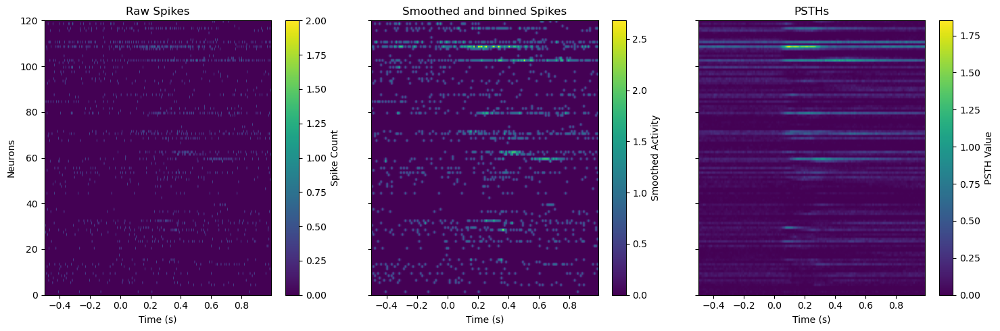

In [10]:
# Example usage:
fig = visualize_neural_activity(
     raw_spikes_1, smth_spikes_1, psths_1, conds_1,
     session='19.0', condition=1,
     T_behavior=T_behavior, T_neural=T_neural,
    trial_index=0,
)
plt.show()

#### Mouse 2

Spikes shape: (33, 150, 135)
Smoothed spikes shape: (33, 149, 135)
PSTHs shape: (1, 149, 135)


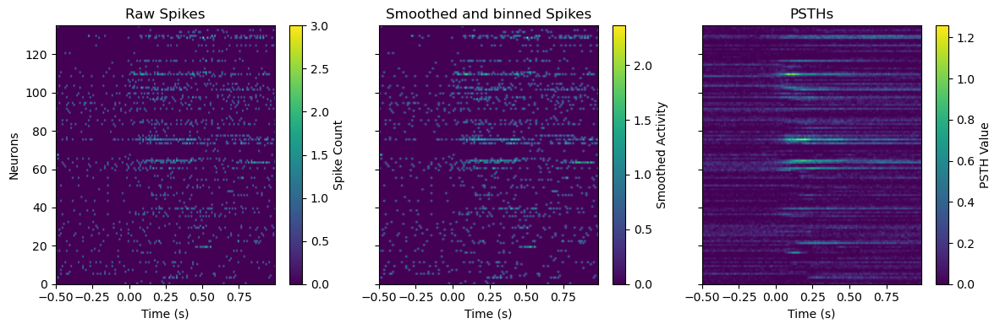

In [11]:
fig = visualize_neural_activity(
    raw_spikes=spikes_2,          # Using spikes_2 instead of raw_spikes_1
    smth_spikes=smth_spikes_2,    # Using smth_spikes_2
    psths=psths_2,                # Using psths_2
    conds=conds_2,                # Using conds_2
    session='4.0',                # Session 4.0 instead of 19.0
    condition=1,                  # Same condition
    T_behavior=T_behavior,
    T_neural=T_neural,
    trial_index=0,                # Same trial index
    figsize=(12, 4)              # Slightly smaller figure size for default subplot size
)

### Updating the keys to match

In [12]:
from data_loading import update_dict_keys_inplace

update_dict_keys_inplace(spikes_1)
update_dict_keys_inplace(smth_spikes_1)
update_dict_keys_inplace(conds_1)
update_dict_keys_inplace(spikes_2)
update_dict_keys_inplace(smth_spikes_2)
update_dict_keys_inplace(conds_2)

## Step 3: Filtering out invalid trials (based on pellet distance) 

In [13]:
from behavioural_utils import identify_pd_outliers, plot_filtered_pd_trials, normalize_data
from data_loading import format_session_key
import numpy as np

In [14]:
def process_behavioral_neural_data(
    behavior_data, 
    spikes, 
    smth_spikes,
    T_behavior,
    std_threshold=2.0,
    time_window=(0.080, 0.498),
    std_check_window=(0.20, 0.45),
    filter_criteria='irregular_pd',
    verbose=True,
    normalize=True
):
    """
    Process behavioral and neural data across sessions, computing grip aperture and filtering trials.
    Includes plotting of filtered trials.
    
    Parameters:
    -----------
    behavior_data : dict
        Dictionary containing behavioral data for each session
    spikes : dict
        Dictionary containing spike data for each session
    smth_spikes : dict
        Dictionary containing smoothed spike data for each session
    T_behavior : numpy.ndarray
        Time points for behavioral data
    std_threshold : float, optional
        Standard deviation threshold for outlier detection (default: 2.0)
    time_window : tuple, optional
        (start_time, end_time) for grip aperture calculation (default: (0.080, 0.498))
    std_check_window : tuple, optional
        (start_time, end_time) for standard deviation check (default: (0.20, 0.45))
    filter_criteria : str, optional
        Criteria for filtering trials ('all', 'irregular_pd', or 'none') (default: 'irregular_pd')
    verbose : bool, optional
        Whether to print detailed information (default: True)
    normalize : bool, optional
        Whether to normalize the data (default: True)
    
    Returns:
    --------
    dict
        Dictionary containing:
        - 'max_grip_aperture_times': dict of max grip aperture times by session
        - 'average_max_ga': list of median max grip aperture times
        - 'processed_behavior': updated behavior data
        - 'processed_spikes': updated spikes data
        - 'processed_smth_spikes': updated smoothed spikes data
        - 'sessions_processed': list of sessions that were processed
    """
    max_grip_aperture_times_by_session = {}
    average_max_ga_list = []
    
    # Get sessions to process (sessions < 22)
    sessions_to_plot = [k for k in smth_spikes.keys() if int(float(k)) < 22]
    if verbose:
        print(sessions_to_plot)
        print(f"Number of sessions: {len(sessions_to_plot)}")
    
    # Process each session
    for session_key in sessions_to_plot:
        if verbose:
            print('Session key')
            print(session_key)

        # Skip invalid sessions
        if not session_key in spikes.keys() or session_key == '7':
            continue
            
        formatted_key = format_session_key(session_key)
        if formatted_key not in behavior_data:
            if verbose:
                print(f"Warning: Behavior data not found for session {formatted_key}")
            continue
            
        behavior_session_data = behavior_data[formatted_key]
        X_interp = behavior_session_data

        if verbose:
            print(X_interp.shape)
            
        if X_interp.shape[0] < 19:
            continue
            
        if verbose:
            print(X_interp.shape)

        # Compute grip aperture
        thumb = X_interp[:, :, 0:3]
        pinky = X_interp[:, :, 3:6]
        grip_ap = np.linalg.norm(thumb - pinky, ord=2, axis=2)
        
        if verbose:
            print(grip_ap.shape)

        # Pellet distance-based filtering
        std_check_start_time = std_check_window[0]  # 0.20
        std_check_end_time = std_check_window[1]    # 0.45
        
        outlier_categories = identify_pd_outliers(
            behavior_session_data, 
            T_behavior,
            std_threshold=std_threshold, 
            std_check_start_time=std_check_start_time,
            std_check_end_time=std_check_end_time
        )
        
        """
        # Plot the filtered trials vs excluded trials - THIS WAS MISSING
        plot_filtered_pd_trials(
            grip_ap, 
            behavior_session_data, 
            T_behavior, 
            session_key, 
            outlier_categories, 
            filter_criteria, 
            std_threshold=std_threshold, 
            std_check_start_time=std_check_start_time,
            std_check_end_time=std_check_end_time
        )
        """
        
        # Determine which trials to include based on filter criteria
        if filter_criteria == 'all':
            # Exclude all outliers (keep only normal trials)
            included_trials = outlier_categories['normal']
        elif filter_criteria == 'irregular_pd':
            # Exclude trials with irregular pd values
            included_trials = np.setdiff1d(outlier_categories['valid'], outlier_categories['irregular_pd'])
        elif filter_criteria == 'none':
            # No filtering - use all trials
            included_trials = np.arange(grip_ap.shape[0])
        else:
            # Default: include all valid trials
            included_trials = outlier_categories['valid']
        
        if verbose:
            print(f"Total trials: {len(outlier_categories['valid'])}")
            print(f"Trials after filtering: {len(included_trials)}")

        # Max grip aperture time calculation
        max_grip_aperture_times = []
        
        # Find the index corresponding to start and end times in T_behavior
        time_threshold = time_window[0]  # 0.080
        time_idx_threshold = np.argmin(np.abs(T_behavior - time_threshold))

        T_end = time_window[1]  # 0.498
        time_idx_end = np.argmin(np.abs(T_behavior - T_end))

        # Ensure the end index corresponds to a time <= T_end
        while T_behavior[time_idx_end] > T_end and time_idx_end > 0:
            time_idx_end -= 1

        # Get index after the last point <= T_end for slicing
        slice_end_idx = time_idx_end + 1

        for trial in range(grip_ap.shape[0]):
            if slice_end_idx > time_idx_threshold:
                trial_grip_ap_window = grip_ap[trial, time_idx_threshold:slice_end_idx]

                if trial_grip_ap_window.size > 0:
                    max_grip_idx_in_window = np.argmax(trial_grip_ap_window)
                    max_grip_idx = max_grip_idx_in_window + time_idx_threshold
                    max_grip_time = T_behavior[max_grip_idx]
                    max_grip_aperture_times.append(max_grip_time)
                else:
                    if verbose:
                        print(f"Warning: Empty grip aperture window for trial {trial} despite valid indices. Skipping max grip calculation.")
                    max_grip_aperture_times.append(np.nan)
            else:
                if verbose:
                    print(f"Warning: Invalid time window for trial {trial}. Start index {time_idx_threshold}, End index {slice_end_idx}. Skipping max grip calculation.")
                max_grip_aperture_times.append(np.nan)

        # Save max grip aperture times
        max_grip_aperture_times = np.array(max_grip_aperture_times)
        
        if verbose:
            print(f"Max grip aperture times shape: {max_grip_aperture_times.shape}")
            print(max_grip_aperture_times)
        
        # Filter max grip aperture times by included trials
        max_grip_aperture_times = max_grip_aperture_times[included_trials]
        max_grip_aperture_times_by_session[session_key] = max_grip_aperture_times

        if verbose:
            print(X_interp.shape)
            print(included_trials)
        
        # Save conditions and filter data
        X_interp = X_interp[included_trials]
        
        if verbose:
            print(X_interp.shape)
        
        # Add grip aperture as a new dimension
        grip_ap_reshaped = grip_ap[included_trials, :, np.newaxis]
        
        if verbose:
            print('grip_ap_reshaped')
            print(grip_ap_reshaped.shape)
        
        X_interp_with_grip = np.concatenate((X_interp, grip_ap_reshaped), axis=2)
        X_interp = X_interp_with_grip
        
        # Update data structures
        behavior_data[formatted_key] = X_interp_with_grip
        spikes_temp = spikes[session_key]
        spikes[session_key] = spikes_temp[included_trials]
        smth_spikes_temp = smth_spikes[session_key]
        smth_spikes[session_key] = smth_spikes_temp[included_trials]

        if verbose:
            print(X_interp.shape)

        # Calculate average max grip aperture
        average_max_ga_list.append(np.median(max_grip_aperture_times))
    
    return {
        'max_grip_aperture_times': max_grip_aperture_times_by_session,
        'average_max_ga': average_max_ga_list,
        'processed_behavior': behavior_data,
        'processed_spikes': spikes,
        'processed_smth_spikes': smth_spikes,
        'sessions_processed': sessions_to_plot
    }


#### Mouse #1 

In [15]:
# Example usage:
results = process_behavioral_neural_data(
    behavior_1,
    spikes_1,
    smth_spikes_1,
    T_behavior,
    std_threshold=2.0,
    verbose=True)
# 
#  Access results
max_grip_aperture_times_by_session_1 = results['max_grip_aperture_times']
average_max_ga_list_1 = results['average_max_ga']
behavior_1 = results['processed_behavior']
spikes_1 = results['processed_spikes']
smth_spikes_1 = results['processed_smth_spikes']

['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '20', '21']
Number of sessions: 21
Session key
1
(36, 750, 19)
(36, 750, 19)
(36, 750)
Total trials: 36
Trials after filtering: 31
Max grip aperture times shape: (36,)
[0.45  0.172 0.206 0.202 0.202 0.174 0.172 0.216 0.244 0.162 0.16  0.188
 0.19  0.372 0.18  0.16  0.18  0.206 0.184 0.174 0.174 0.216 0.218 0.206
 0.182 0.18  0.208 0.43  0.178 0.204 0.174 0.244 0.174 0.392 0.184 0.16 ]
(36, 750, 19)
[ 1  2  3  4  5  6  7  8  9 10 11 12 14 15 16 17 18 19 20 22 23 24 25 26
 28 29 30 31 32 34 35]
(31, 750, 19)
grip_ap_reshaped
(31, 750, 1)
(31, 750, 20)
Session key
2
(28, 750, 19)
(28, 750, 19)
(28, 750)
Total trials: 28
Trials after filtering: 24
Max grip aperture times shape: (28,)
[0.174 0.178 0.178 0.192 0.18  0.498 0.194 0.17  0.168 0.172 0.194 0.236
 0.37  0.166 0.172 0.218 0.184 0.154 0.378 0.208 0.406 0.28  0.152 0.156
 0.158 0.08  0.188 0.398]
(28, 750, 19)
[ 0  1  2  4  6  7 

#### Mouse 2

In [16]:
# Call the function for dataset 2
results_2 = process_behavioral_neural_data(
    behavior_data=behavior_2,
    spikes=spikes_2,
    smth_spikes=smth_spikes_2,
    T_behavior=T_behavior,
    std_threshold=2,
    time_window=(0.080, 0.498),
    std_check_window=(0.20, 0.45),
    filter_criteria='irregular_pd',
    verbose=True,
    normalize=True
)

# Extract the results
max_grip_aperture_times_by_session_2 = results_2['max_grip_aperture_times']
average_max_ga_list_2 = results_2['average_max_ga']
behavior_2 = results_2['processed_behavior']
spikes_2 = results_2['processed_spikes']
smth_spikes_2 = results_2['processed_smth_spikes']
sessions_to_plot_2 = results_2['sessions_processed']
num_sessions_2 = len(sessions_to_plot_2)

print(f"Processed {num_sessions_2} sessions for dataset 2")

['1', '2', '3', '4', '5', '6']
Number of sessions: 6
Session key
1
(31, 750, 19)
(31, 750, 19)
(31, 750)
Total trials: 31
Trials after filtering: 26
Max grip aperture times shape: (31,)
[0.318 0.246 0.218 0.212 0.204 0.186 0.212 0.408 0.468 0.146 0.162 0.206
 0.184 0.16  0.156 0.19  0.16  0.152 0.154 0.152 0.304 0.156 0.148 0.142
 0.17  0.158 0.142 0.148 0.152 0.14  0.134]
(31, 750, 19)
[ 0  1  2  3  4  5  6 10 11 12 13 14 15 16 17 18 19 21 22 24 25 26 27 28
 29 30]
(26, 750, 19)
grip_ap_reshaped
(26, 750, 1)
(26, 750, 20)
Session key
2
(29, 750, 19)
(29, 750, 19)
(29, 750)
Total trials: 29
Trials after filtering: 24
Max grip aperture times shape: (29,)
[0.18  0.138 0.162 0.144 0.132 0.14  0.134 0.144 0.142 0.154 0.158 0.144
 0.138 0.152 0.17  0.144 0.138 0.128 0.148 0.162 0.142 0.15  0.158 0.222
 0.474 0.356 0.332 0.262 0.172]
(29, 750, 19)
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 27 28]
(24, 750, 19)
grip_ap_reshaped
(24, 750, 1)
(24, 750, 20)
Session key
3


### Example of timeseries plot

In [17]:
from behavioural_utils import plot_comparison_behavioral_timeseries

In [18]:
indices_of_interest=[0, 2, 9, 11, 18, 19]
dimension_names=["Pinky X", "Hand X", "Pinky velocity", "Hand X velocity", "Pellet distance", "Grip aperture"]

In [19]:
"""

session_key = 19
session_key_2 = 6
# Example usage with data from two mice
fig = plot_comparison_behavioral_timeseries(
    behavior_data_mouse1=behavior_1[format_session_key(session_key)],
    behavior_data_mouse2=behavior_2[format_session_key(session_key_2)],
    T_behavior=T_behavior,
    session_key_mouse1=session_key,
    session_key_mouse2=session_key_2,
    indices_of_interest=[0, 2, 9, 11, 18, 19],
    dimension_names=["Pinky X", "Hand X", "Pinky velocity", "Hand X velocity", "Pellet distance", "Grip aperture"],
    save_plot=True,
    output_file="behavioral_comparison.png"
)

fig.show()
"""


'\n\nsession_key = 19\nsession_key_2 = 6\n# Example usage with data from two mice\nfig = plot_comparison_behavioral_timeseries(\n    behavior_data_mouse1=behavior_1[format_session_key(session_key)],\n    behavior_data_mouse2=behavior_2[format_session_key(session_key_2)],\n    T_behavior=T_behavior,\n    session_key_mouse1=session_key,\n    session_key_mouse2=session_key_2,\n    indices_of_interest=[0, 2, 9, 11, 18, 19],\n    dimension_names=["Pinky X", "Hand X", "Pinky velocity", "Hand X velocity", "Pellet distance", "Grip aperture"],\n    save_plot=True,\n    output_file="behavioral_comparison.png"\n)\n\nfig.show()\n'

## Step 4: Lower-dimensional representation of the reach-to-graps sequence 

In [20]:
from behavioural_utils import create_time_window_matrix_new
from behavioural_utils import process_data_for_vector_spaces
from behavioural_utils import plot_and_save_components

### Parameters definition 

In [21]:
winsize = 15
n_behavioral_dims = 20
pre_dims = 1
movement_onset = 0   
list_of_components = [0, 1]
context_window = 250

tP_0_m1 = -25 * dt  #9
tL_0_m1 = 30 * dt #-25 * dt# -14 *dt #movement_onset - 10 *dt

tP_0_m2 = -25 * dt
tL_0_m2 = 40 * dt


In [22]:

# Initialize lists to store data for each session
X_interp_filtered_list_1 = []
Qp_list_1 = []
Ql_list_1 = []
T_behavior_list_1 = []
winsize_P_list_1 = []
tP_0_list_1 = []
tL_0_list_1 = []
dt_list_1 = []
movement_onset_list_1 = []
context_window_list_1 = []
stats_P_list_1 = []
stats_L_list_1 = []

# Initialize lists to store data for each session
X_interp_filtered_list_2 = []
Qp_list_2 = []
Ql_list_2 = []
T_behavior_list_2 = []
winsize_P_list_2 = []
tP_0_list_2 = []
tL_0_list_2 = []
dt_list_2 = []
movement_onset_list_2 = []
context_window_list_2 = []
stats_P_list_2 = []
stats_L_list_2 = []

### Mouse #1 - motif 1

['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '20', '21']
21
Session key
1
(31, 750, 20)
Optimizing...
                                            f: -1.851464e+00   |grad|: 1.159209e-01
acc       k:     1     num_inner:     2     f: -1.857671e+00   |grad|: 6.446254e-03   reached target residual-kappa (linear)
acc       k:     2     num_inner:     4     f: -1.857686e+00   |grad|: 2.239887e-05   reached target residual-theta (superlinear)
acc       k:     3     num_inner:     8     f: -1.857686e+00   |grad|: 2.676683e-10   reached target residual-theta (superlinear)
Terminated - min grad norm reached after 3 iterations, 0.02 seconds.

(31, 20)
(31, 20)
(20, 1)
(20, 1)
(31, 20)
(31, 1)
(31, 20)
(31, 1)
Figure saved as /Users/gran/Desktop/final_code_hand-in/355_session_1/components_355_session_1.png
Session key
2
(24, 750, 20)
Optimizing...
                                            f: -1.956739e+00   |grad|: 1.291844e-01
acc   

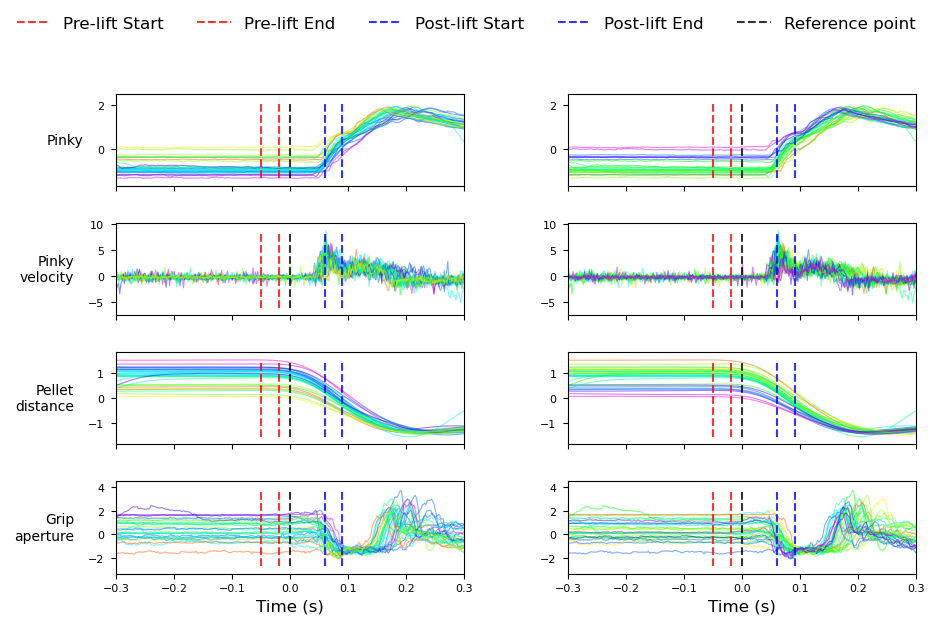

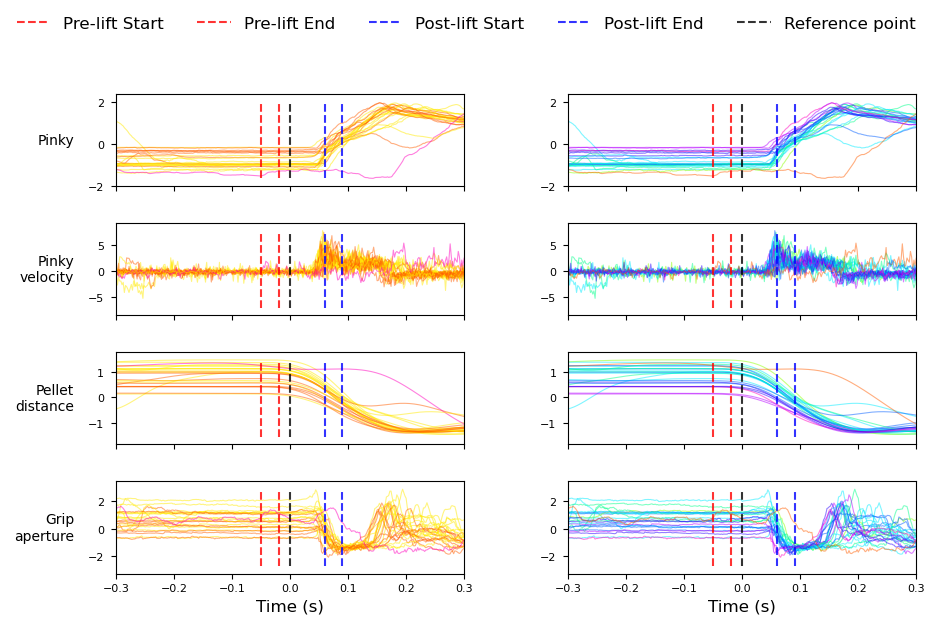

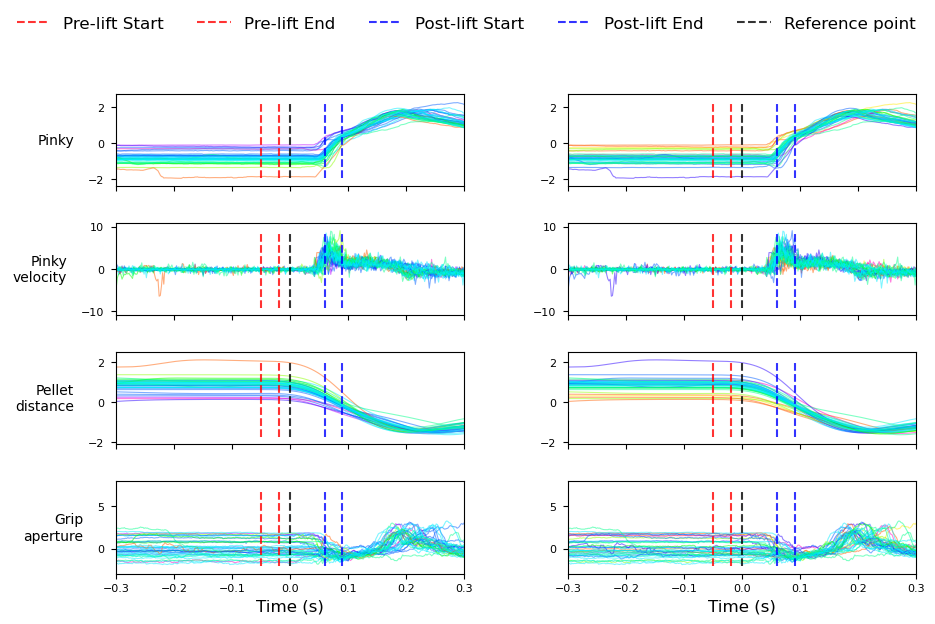

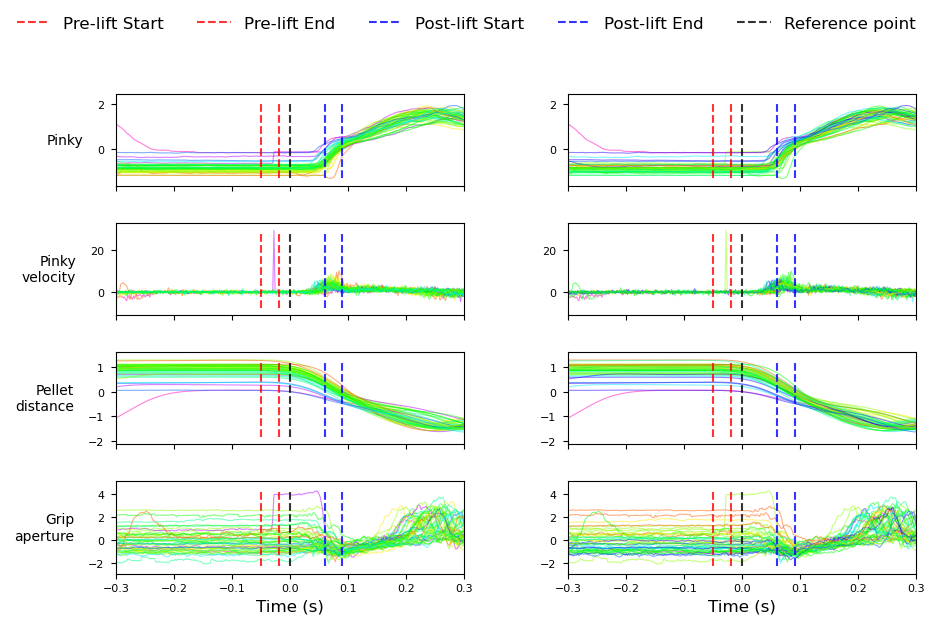

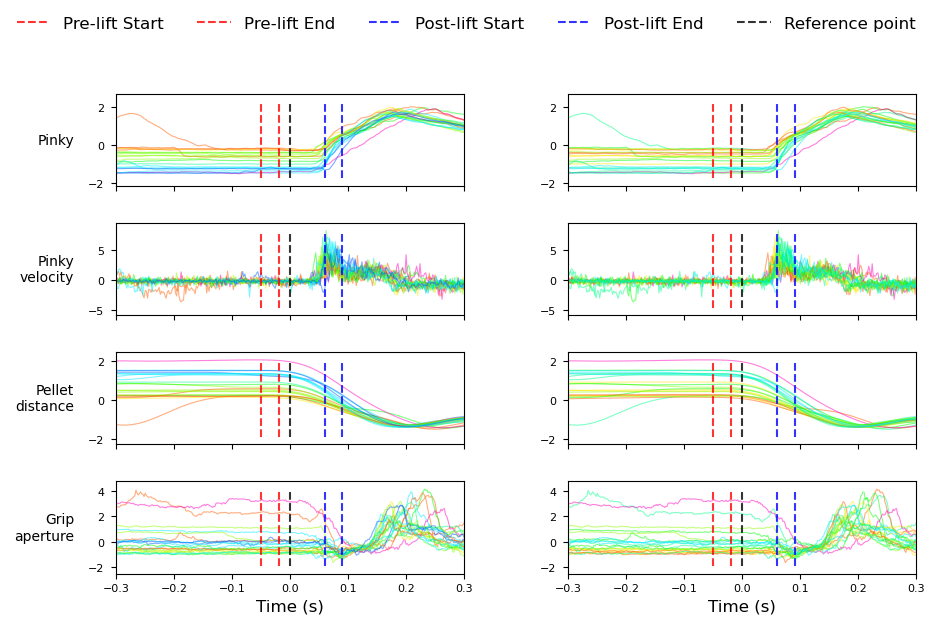

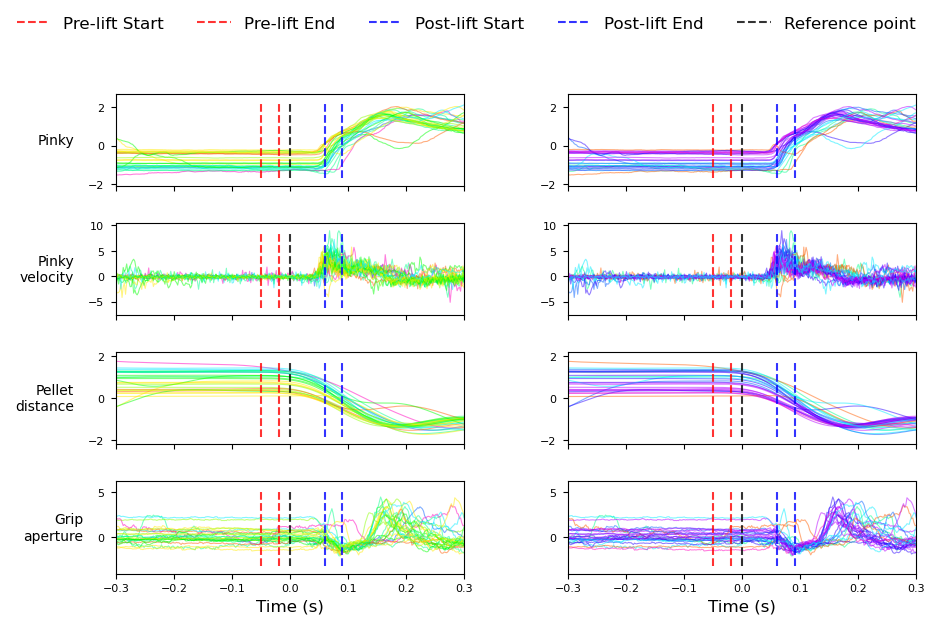

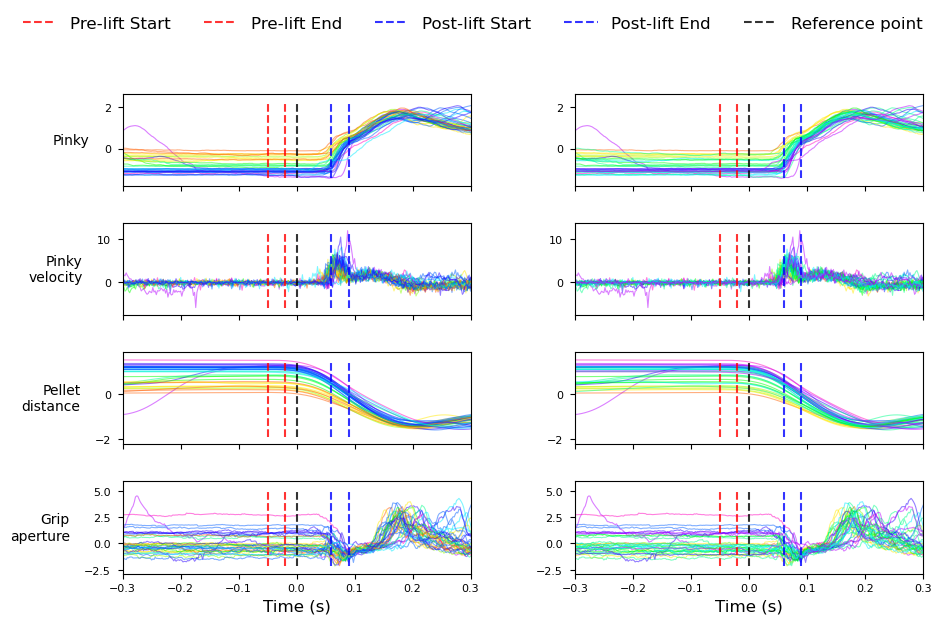

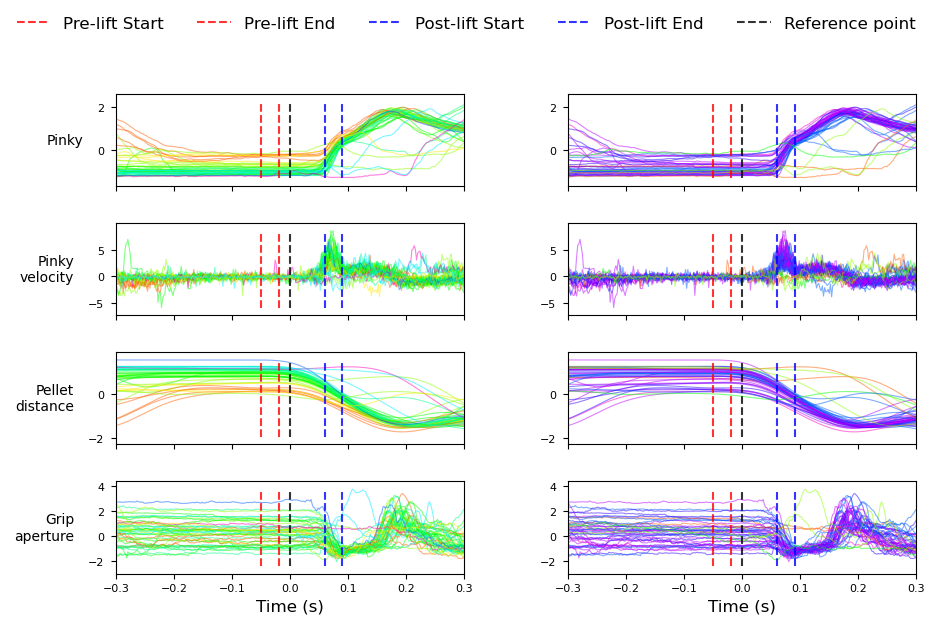

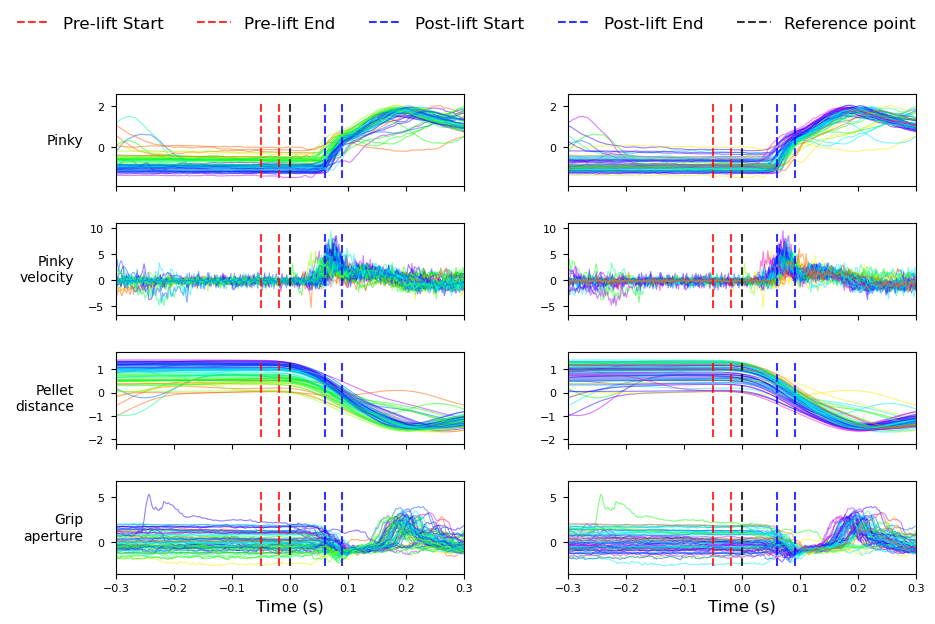

In [23]:
sessions_to_plot = [k for k in smth_spikes_1.keys() if int(k) < 22]
print(sessions_to_plot)
num_sessions = len(sessions_to_plot)
print(num_sessions)
normalize = True

for session_key in sessions_to_plot:
    print('Session key')
    print(session_key)

    if not session_key in spikes_1.keys() or session_key == '7':
        continue
    

    formatted_key = format_session_key(session_key)
    if formatted_key not in behavior_1:
        print(f"Warning: Behavior data not found for session {formatted_key}")
        continue
    

    behavior_data = behavior_1[format_session_key(session_key)]
    X_interp = behavior_data  

    if X_interp.shape[0] < 20:
        continue
    print(X_interp.shape)


    ### <computing lower dimensional dims> 
    X_interp = np.transpose(X_interp, (1, 2, 0))
    X_interp = normalize_data(X_interp, 0, 499)

    # Process data for vector spaces (Rest to reach)
    P_1, stats_P_1, L_1, stats_L_1, Qp_1, Ql_1, P_proj_1, L_proj_1, principal_components_1, \
    pre_lift_start_1, pre_lift_end_1, post_lift_start_1, post_lift_end_1 = process_data_for_vector_spaces(X_interp, T_behavior, tP_0_m1, tL_0_m1,
                                       winsize, dt,  n_behavioral_dims, pre_dims=1)


    print(P_1.shape)
    print(P_proj_1.shape)
    print(L_1.shape)
    print(L_proj_1.shape)
    

    output_file = plot_and_save_components(
        X_interp_filtered= X_interp,
        P_proj=P_proj_1,
        L_proj=L_proj_1,
        T_behavior=T_behavior,
        tP_0=tP_0_m1,
        tL_0=tL_0_m1,
        winsize=winsize,
        dt=dt,
        movement_onset=movement_onset,
        n_behavioral_dims=n_behavioral_dims,
        n_trials=X_interp.shape[2],
        mouse=mouse1,
        session_number=session_key,
        list_of_components=[0, 1],  # Components to plot
        #dims_to_plot=[0, 2, 9, 11, 18, 19],
        #dim_names=["Pinky X", "Hand ", "Pinky velocity", "Hand velocity", "Pellet distance", "Grip aperture"],
        #dim_names=[r"Pinky X", r"Hand X", r"Pinky $\dot{X}$", r"Hand $\dot{X}$", r"Pellet distance", r"Grip aperture"],
        dims_to_plot=[0, 9, 18, 19],
        dim_names=["Pinky", "Pinky velocity", "Pellet distance", "Grip aperture"],
        fig_width=10,  # 10 inches wide
        fig_height=6,  # 8 inches tall
        dpi=300  # High resolution (300 DPI is publication quality)
    )


    # Add data to lists
    X_interp_filtered_list_1.append(X_interp)
    Qp_list_1.append(Qp_1)
    Ql_list_1.append(Ql_1)
    T_behavior_list_1.append(T_behavior)
    winsize_P_list_1.append(winsize)
    tP_0_list_1.append(tP_0_m1)
    tL_0_list_1.append(tL_0_m1)
    dt_list_1.append(dt)
    movement_onset_list_1.append(movement_onset)
    context_window_list_1.append(context_window)
    stats_P_list_1.append(stats_P_1)
    stats_L_list_1.append(stats_L_1)
    

### Mouse 2 - motif 1

['1', '2', '3', '4', '5', '6']
6
Session key
1
(26, 750, 20)
Optimizing...
                                            f: -1.985756e+00   |grad|: 4.794925e-02
acc       k:     1     num_inner:     3     f: -1.987044e+00   |grad|: 2.538921e-03   reached target residual-theta (superlinear)
acc       k:     2     num_inner:     6     f: -1.987048e+00   |grad|: 2.729530e-06   reached target residual-theta (superlinear)
acc       k:     3     num_inner:     9     f: -1.987048e+00   |grad|: 9.191935e-13   reached target residual-theta (superlinear)
Terminated - min grad norm reached after 3 iterations, 0.02 seconds.

(26, 20)
(26, 20)
(20, 1)
(20, 1)
(26, 20)
(26, 1)
(26, 20)
(26, 1)
Figure saved as /Users/gran/Desktop/final_code_hand-in/364_session_1/components_364_session_1.png
Session key
2
(24, 750, 20)
Optimizing...
                                            f: -1.993585e+00   |grad|: 3.323767e-02
acc       k:     1     num_inner:     2     f: -1.994112e+00   |grad|: 8.265835e-04   rea

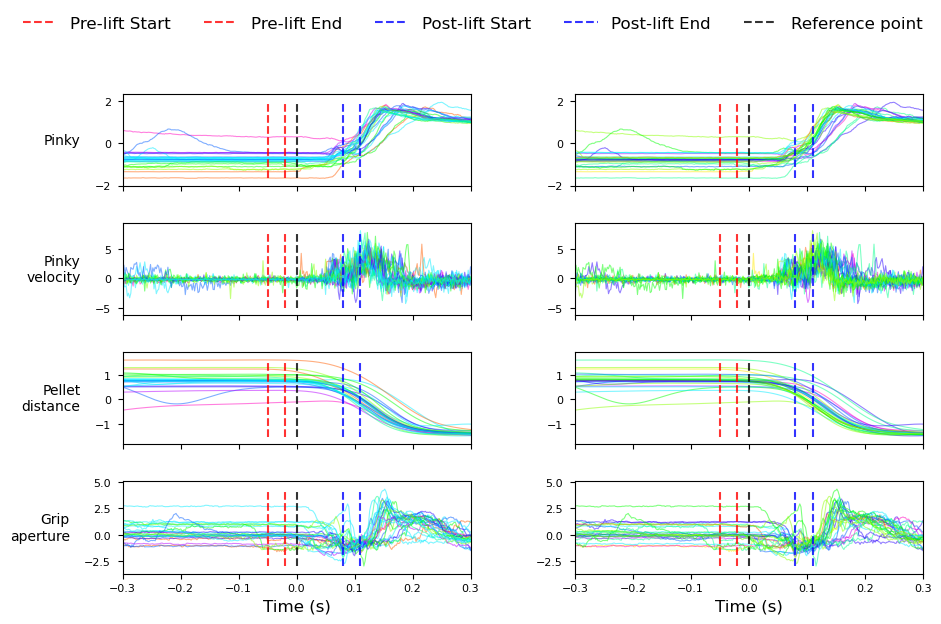

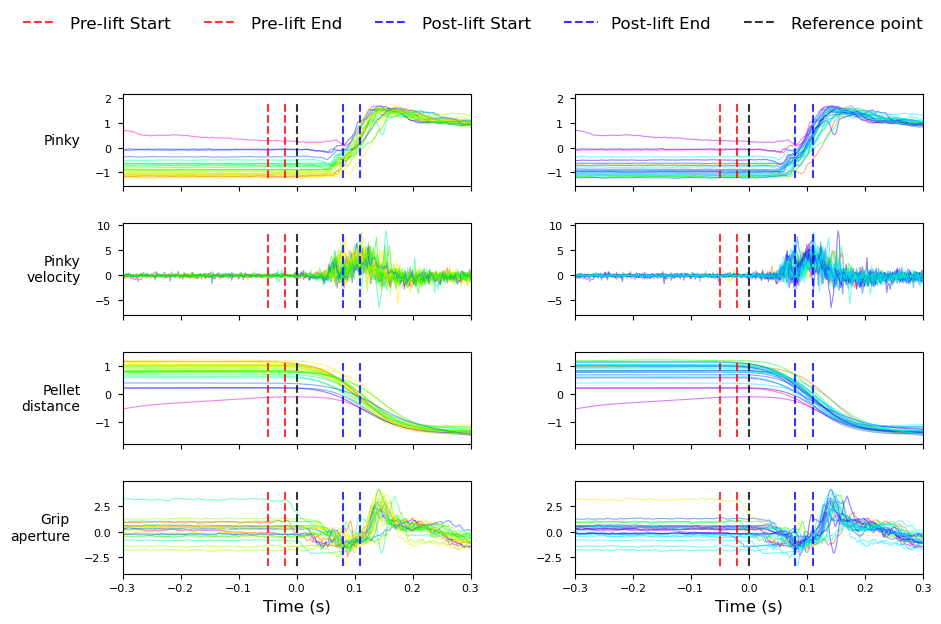

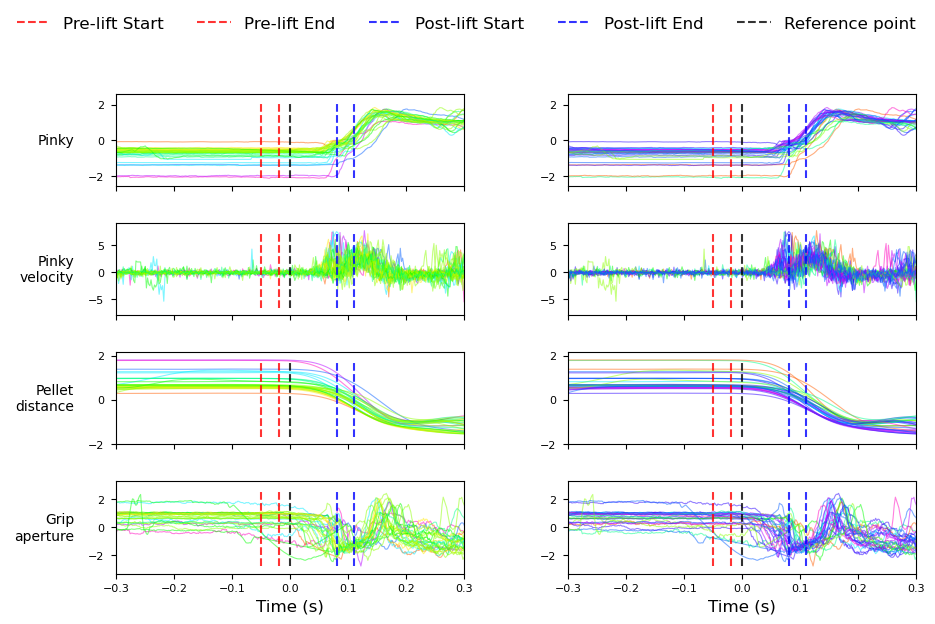

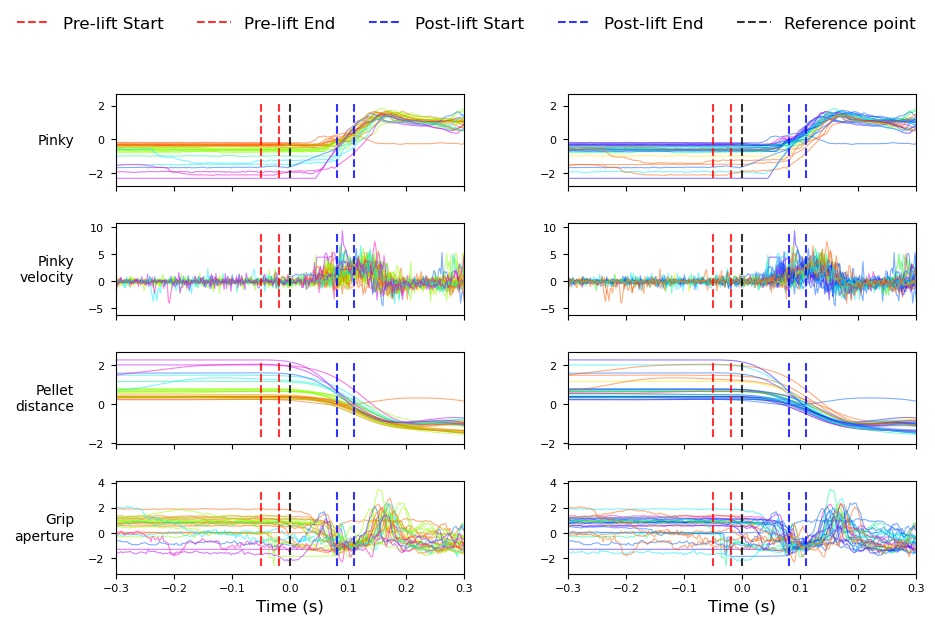

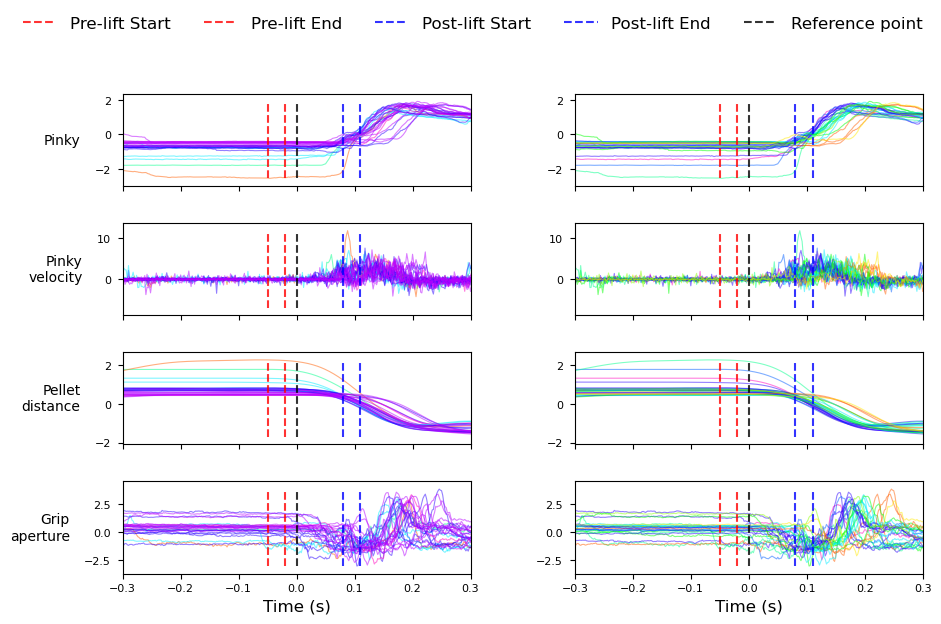

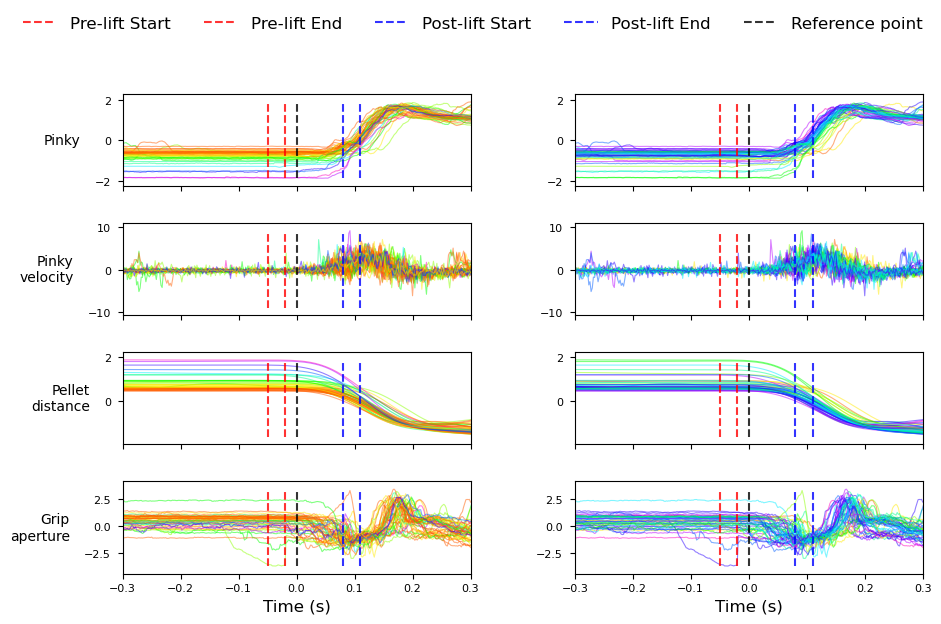

In [24]:
sessions_to_plot = [k for k in smth_spikes_2.keys() if int(k) < 22]
print(sessions_to_plot)
num_sessions = len(sessions_to_plot)
print(num_sessions)
normalize = True


for session_key in sessions_to_plot:
    print('Session key')
    print(session_key)

    if not session_key in spikes_2.keys() or session_key == '7':
        continue
    

    formatted_key = format_session_key(session_key)
    if formatted_key not in behavior_2:
        print(f"Warning: Behavior data not found for session {formatted_key}")
        continue
    

    behavior_data = behavior_2[format_session_key(session_key)]
    X_interp = behavior_data  

    if X_interp.shape[0] < 20:
        continue
    print(X_interp.shape)


    ### <computing lower dimensional dims> 
    X_interp = np.transpose(X_interp, (1, 2, 0))
    X_interp = normalize_data(X_interp, 0, 499)

    # Process data for vector spaces (Rest to reach)
    P_1, stats_P_1, L_1, stats_L_1, Qp_1, Ql_1, P_proj_1, L_proj_1, principal_components_1, \
    pre_lift_start_1, pre_lift_end_1, post_lift_start_1, post_lift_end_1 = process_data_for_vector_spaces(X_interp, T_behavior, tP_0_m2, tL_0_m2,
                                       winsize, dt,  n_behavioral_dims, pre_dims=1)


    print(P_1.shape)
    print(P_proj_1.shape)
    print(L_1.shape)
    print(L_proj_1.shape)
    

    output_file = plot_and_save_components(
        X_interp_filtered= X_interp,
        P_proj=P_proj_1,
        L_proj=L_proj_1,
        T_behavior=T_behavior,
        tP_0=tP_0_m2,
        tL_0=tL_0_m2,
        winsize=winsize,
        dt=dt,
        movement_onset=movement_onset,
        n_behavioral_dims=n_behavioral_dims,
        n_trials=X_interp.shape[2],
        mouse=mouse2,
        session_number=session_key,
        list_of_components=[0, 1],  # Components to plot
        #dim_names=["Pinky X", "Hand ", "Pinky velocity", "Hand velocity", "Pellet distance", "Grip aperture"],
        #dim_names=[r"Pinky X", r"Hand X", r"Pinky $\dot{X}$", r"Hand $\dot{X}$", r"Pellet distance", r"Grip aperture"],
        dims_to_plot=[0, 9, 18, 19],
        dim_names=["Pinky", "Pinky velocity", "Pellet distance", "Grip aperture"],
        fig_width=10,  # 10 inches wide
        fig_height=6,  # 8 inches tall
        dpi=300  # High resolution (300 DPI is publication quality)
    )


    # Add data to lists
    X_interp_filtered_list_2.append(X_interp)
    Qp_list_2.append(Qp_1)
    Ql_list_2.append(Ql_1)
    T_behavior_list_2.append(T_behavior)
    winsize_P_list_2.append(winsize)
    tP_0_list_2.append(tP_0_m2)
    tL_0_list_2.append(tL_0_m2)
    dt_list_2.append(dt)
    movement_onset_list_2.append(movement_onset)
    context_window_list_2.append(context_window)
    stats_P_list_2.append(stats_P_1)
    stats_L_list_2.append(stats_L_1)
    

### Re-adjust the signal to be centered around grip aperture 

In [25]:
import numpy as np

def convert_times_to_indices(grip_aperture_times_dict, dt, n_time_points_pre):
  """
  Converts a dictionary of grip aperture times (in seconds) to indices.

  Args:
    grip_aperture_times_dict: Dictionary where keys are identifiers and
                               values are numpy arrays of times in seconds.
    dt: Sampling interval in seconds (1 / sampling frequency).
    n_time_points_pre: Number of time points in the pre-event period.

  Returns:
    Dictionary with the same keys but values as numpy arrays of corresponding
    indices.
  """
  grip_aperture_indices_dict = {}
  for key, times_array in grip_aperture_times_dict.items():
    # Calculate indices: time / dt gives the number of samples from the start
    # Add n_time_points_pre to shift relative to the event onset
    indices = np.round(times_array / dt).astype(int) + n_time_points_pre
    grip_aperture_indices_dict[key] = indices
  return grip_aperture_indices_dict


In [26]:
grip_aperture_indices_1 = convert_times_to_indices(max_grip_aperture_times_by_session_1, dt, n_time_points_pre)
grip_aperture_indices_2 = convert_times_to_indices(max_grip_aperture_times_by_session_2, dt, n_time_points_pre)

### Second motif of the sequence: 

#### Parameters defintion 

In [27]:

# These seem related to spike data alignment, not directly used in the behavior alignment below
tP_1_m1 = -60 * dt
tL_1_m1 = 10 * dt

# These seem related to spike data alignment, not directly used in the behavior alignment below
tP_1_m2 = -50 * dt
tL_1_m2 = 5 * dt


# Initialize lists to store data for each session
X_interp_filtered_list_m1 = []
Qp_list_m1 = []
Ql_list_m1 = []
T_behavior_list_m1 = []
winsize_P_list_m1 = []
tP_0_list_m1 = []
tL_0_list_m1 = []
dt_list_m1 = []
movement_onset_list_m1 = []
context_window_list_m1 = []
stats_P_list_m1 = []
stats_L_list_m1 = []

# Initialize lists to store data for each session
X_interp_filtered_list_m2 = []
Qp_list_m2 = []
Ql_list_m2 = []
T_behavior_list_m2 = []
winsize_P_list_m2 = []
tP_0_list_m2 = []
tL_0_list_m2 = []
dt_list_m2 = []
movement_onset_list_m2 = []
context_window_list_m2 = []
stats_P_list_m2 = []
stats_L_list_m2 = []

### Mouse #1 - motif 2

Sessions to process: ['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '20', '21']
Number of sessions: 21

--- Processing Session: 1 ---
Behavior data shape (X_interp): (31, 750, 20)
Number of grip aperture indices: 31
Shape of aligned behavior data for session 1: (31, 500, 20)
(31, 500, 20)
Optimizing...
                                            f: -1.999919e+00   |grad|: 2.271229e-03
acc       k:     1     num_inner:     4     f: -1.999923e+00   |grad|: 2.387368e-06   reached target residual-theta (superlinear)
acc       k:     2     num_inner:     6     f: -1.999923e+00   |grad|: 1.441695e-12   reached target residual-theta (superlinear)
Terminated - min grad norm reached after 2 iterations, 0.01 seconds.

(31, 20)
(31, 20)
(20, 1)
(20, 1)
(31, 20)
(31, 1)
(31, 20)
(31, 1)
Figure saved as /Users/gran/Desktop/final_code_hand-in/355_session_1/components_355_session_1.png

--- Processing Session: 2 ---
Behavior data shape (X_int

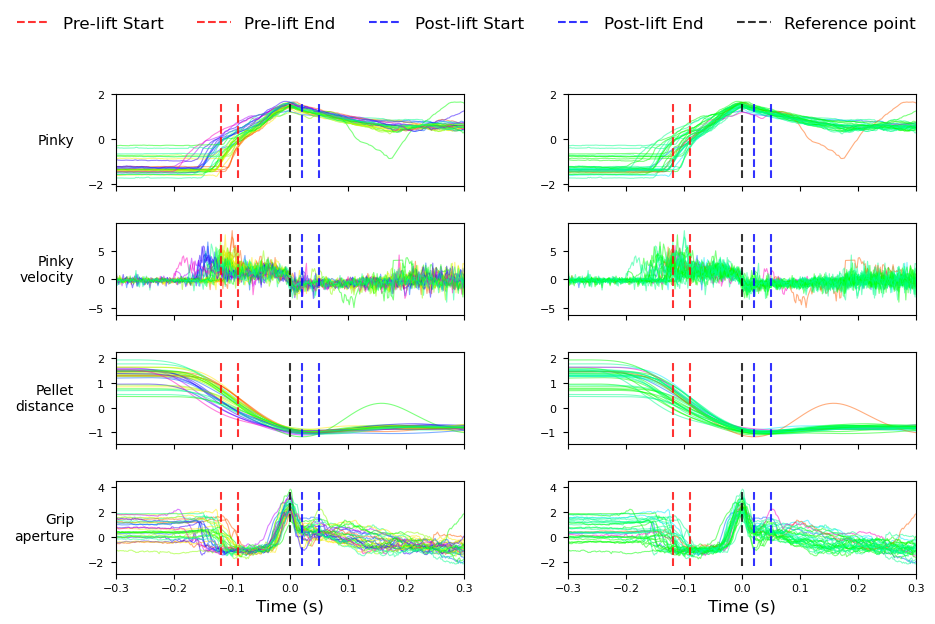

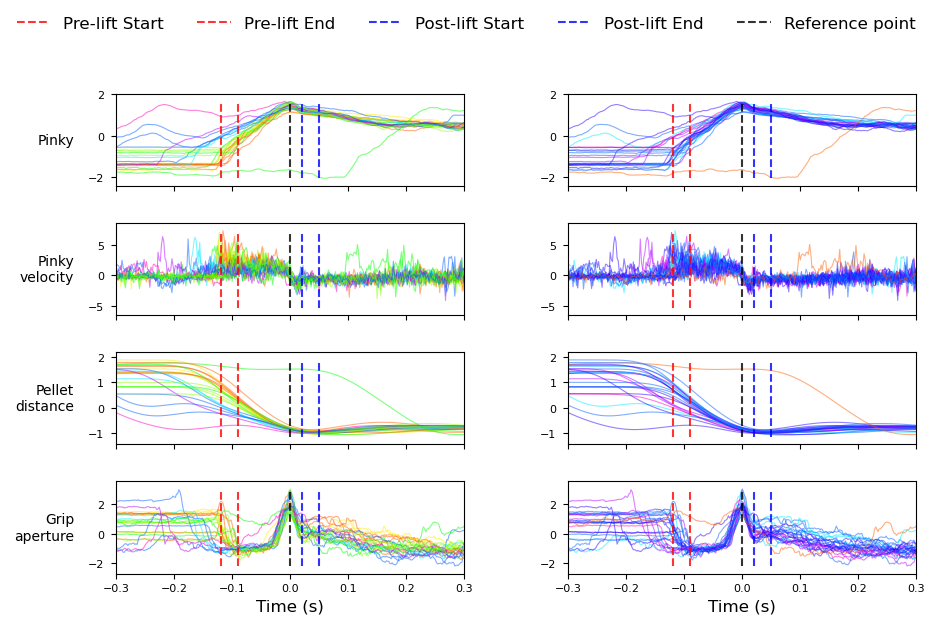

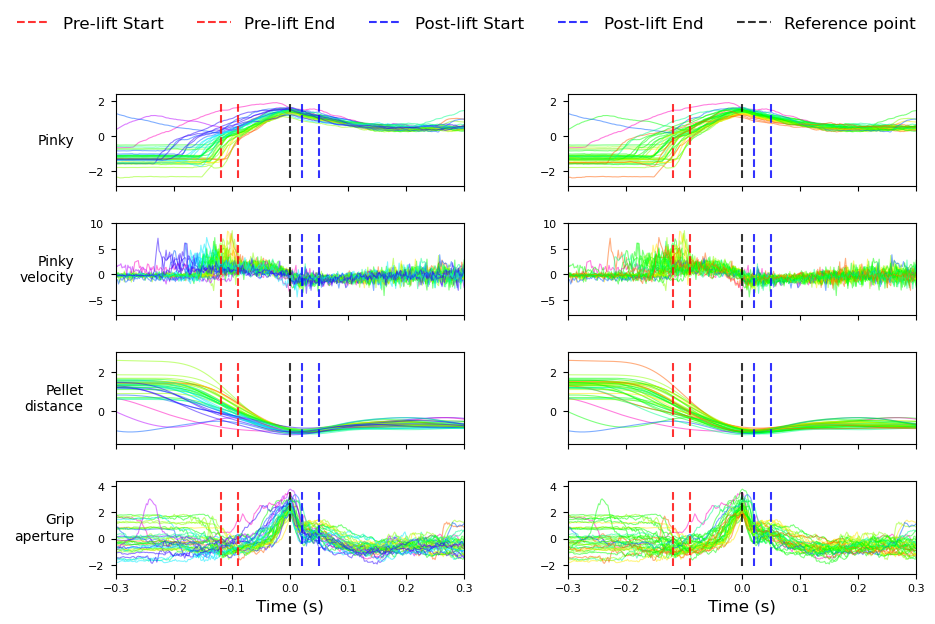

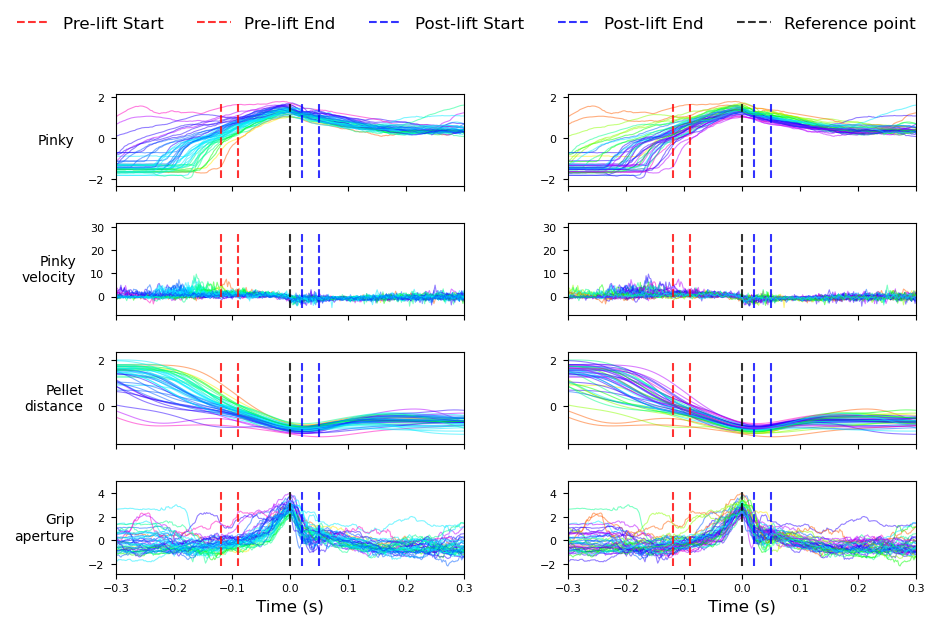

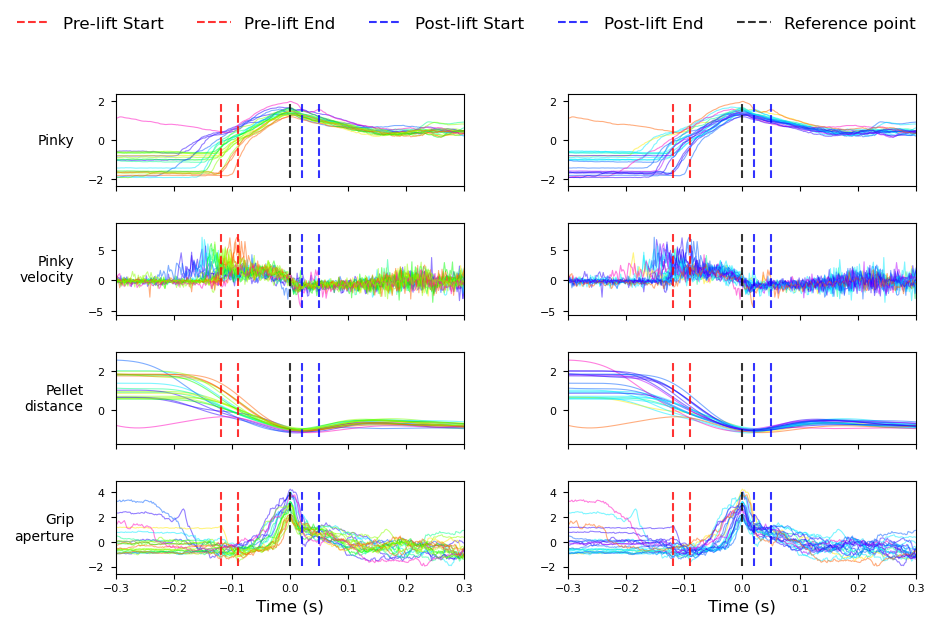

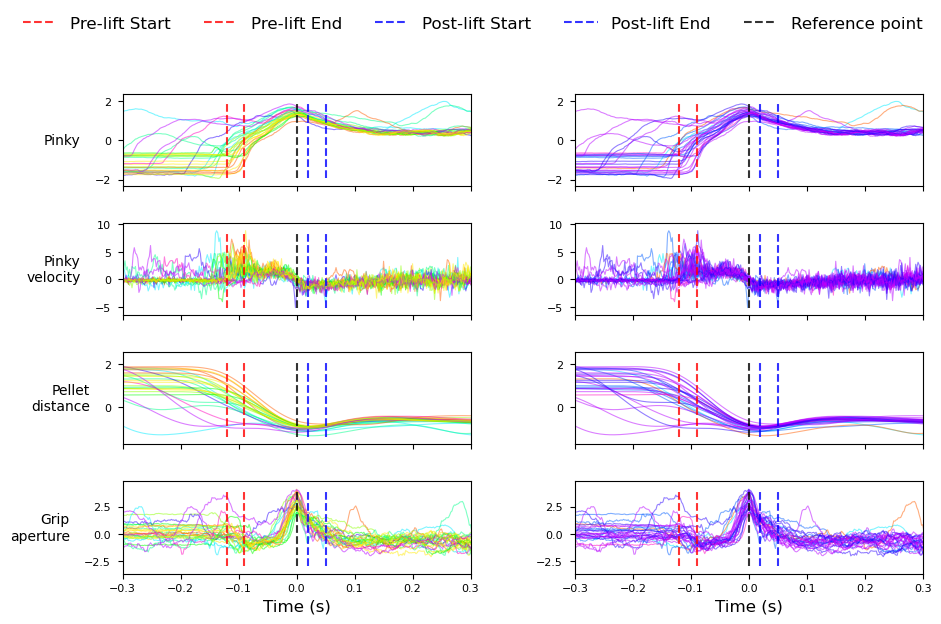

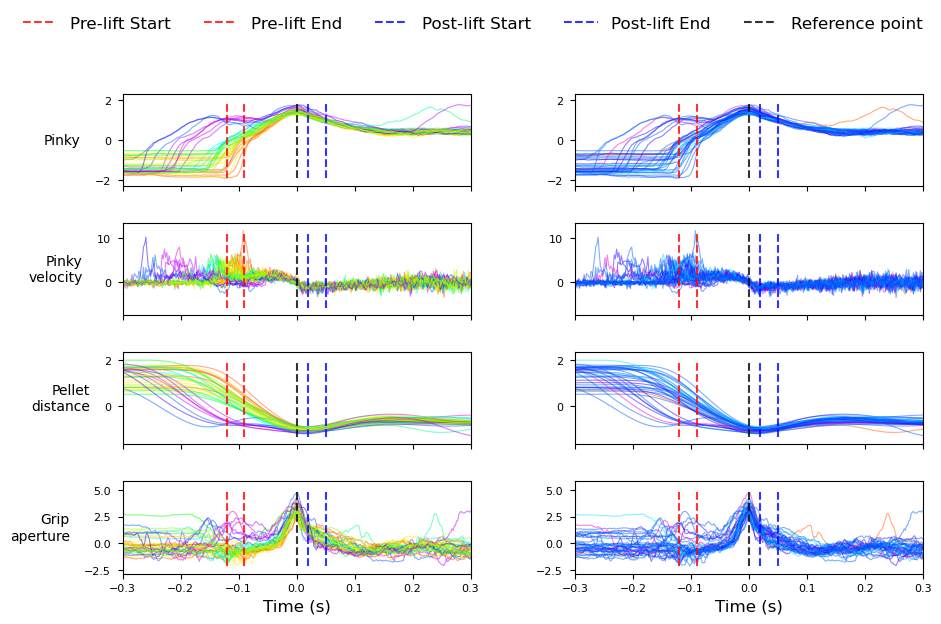

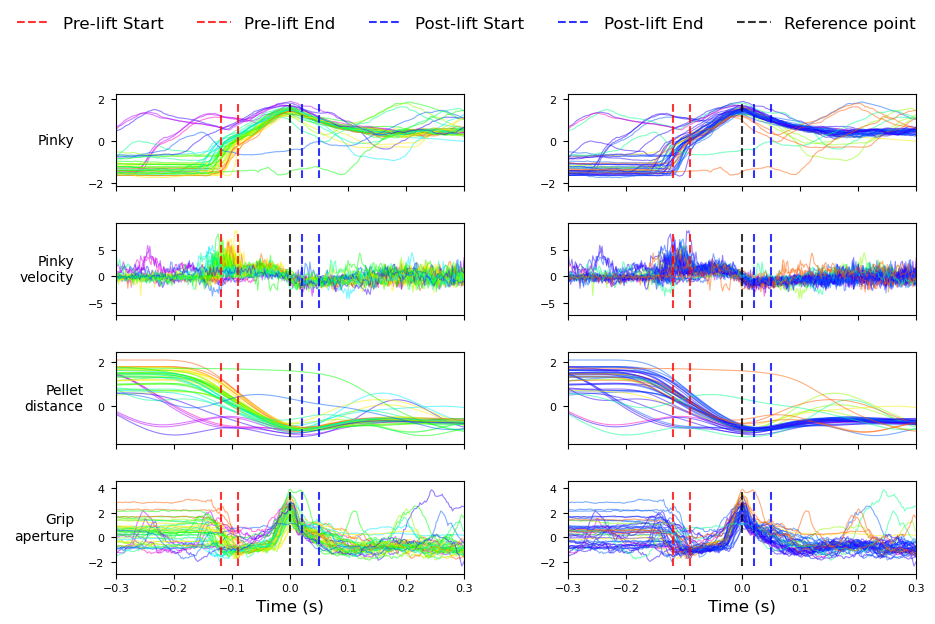

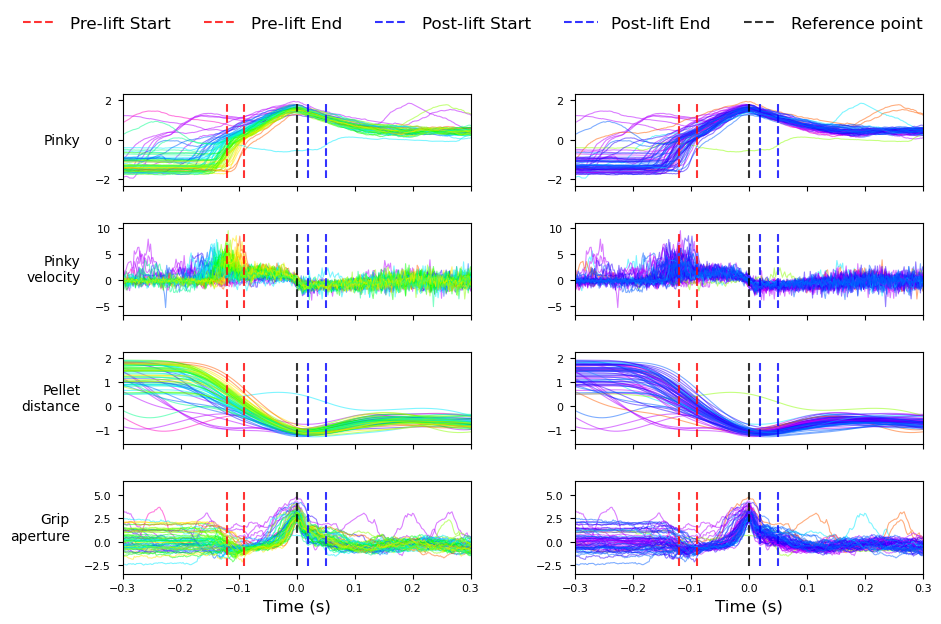

In [28]:
import numpy as np
import matplotlib.pyplot as plt

sessions_to_plot = [k for k in smth_spikes_1.keys() if int(k) < 22]
print(f"Sessions to process: {sessions_to_plot}")
num_sessions = len(sessions_to_plot)
print(f"Number of sessions: {num_sessions}")
# normalize = True # This variable wasn't used in the snippet, keep or remove as needed



for session_key in sessions_to_plot:
    print(f"\n--- Processing Session: {session_key} ---")

    # Check prerequisites for the session
    if session_key not in spikes_1: # Assuming spikes_1 check is still relevant for context
        print(f"Warning: Spike data not found for session {session_key}. Skipping.")
        continue
    if session_key not in grip_aperture_indices_1:
        print(f"Warning: Grip aperture indices not found for session {session_key}. Skipping.")
        continue
    if session_key == '7': # Skip session '7' explicitly
         print("Skipping session '7'.")
         continue

    # Format key and check for behavior data
    formatted_key = format_session_key(session_key)
    if formatted_key not in behavior_1:
        print(f"Warning: Behavior data not found for session {formatted_key}. Skipping.")
        continue

    # Get behavior data for the session
    behavior_data = behavior_1[formatted_key]
    X_interp = behavior_data # Assuming this is the correct variable (trials, time, dims)
    print(f"Behavior data shape (X_interp): {X_interp.shape}")

    # Get pre-calculated grip aperture indices for alignment
    session_grip_indices = grip_aperture_indices_1[session_key]
    print(f"Number of grip aperture indices: {len(session_grip_indices)}")

    # --- Sanity Check: Match trial counts ---
    if X_interp.shape[0] != len(session_grip_indices):
        print(f"Warning: Mismatch in number of trials for session {session_key}. "
              f"Behavior has {X_interp.shape[0]}, Indices have {len(session_grip_indices)}. Skipping alignment.")
        continue

    # --- Align behavior data around max grip aperture index ---
    n_pre = 250
    n_post = 250
    aligned_behavior_windows = []
    valid_trial_indices_for_alignment = [] # Track original trial indices that had valid windows

    for trial_idx in range(X_interp.shape[0]):
        # Get the pre-calculated alignment index for this trial
        try:
            align_idx = int(session_grip_indices[trial_idx])
            # Check for NaN explicitely if indices might contain them
            if np.isnan(align_idx):
                 print(f"Warning: Skipping trial {trial_idx} due to NaN alignment index.")
                 continue
        except (ValueError, TypeError, IndexError): # Added IndexError
            print(f"Warning: Skipping trial {trial_idx} due to invalid or missing index: {session_grip_indices[trial_idx] if trial_idx < len(session_grip_indices) else 'Index out of bounds'}.")
            continue

        # Calculate window start and end indices based on the alignment index
        start_idx = align_idx - n_pre
        end_idx = align_idx + n_post  # +1 for slicing exclusivity

        # Check if the window is within the bounds of the data's time dimension
        if start_idx >= 0 and end_idx <= X_interp.shape[1]:
            # Extract the window for all behavioral dimensions for this trial
            window = X_interp[trial_idx, start_idx:end_idx, :]
            aligned_behavior_windows.append(window)
            valid_trial_indices_for_alignment.append(trial_idx) # Store original index if window is valid
        else:
            print(f"Warning: Skipping trial {trial_idx}. Window [{start_idx}, {end_idx}) "
                  f"out of bounds for data length {X_interp.shape[1]} (align_idx={align_idx}).")

    # Convert the list of valid windows into a 3D numpy array (valid_trials, time, dimensions)
    if not aligned_behavior_windows:
        print(f"Warning: No valid aligned windows found for session {session_key} using provided indices.")
        continue # Skip plotting for this session if no data

    aligned_behavior_array = np.array(aligned_behavior_windows)
    print(f"Shape of aligned behavior data for session {session_key}: {aligned_behavior_array.shape}")

    # Create the corresponding time vector for the aligned window plot
    # Make sure 'dt' is defined in your scope (e.g., dt = 0.002)
    try:
        # This calculation assumes 'dt' is defined earlier
        aligned_time_vector = np.arange(-n_pre, n_post ) * dt
    except NameError:
        print("Error: 'dt' is not defined. Cannot create time vector for plot.")
        # Handle error, maybe define dt = 0.002 here if it's always constant, or skip plotting
        dt = 0.002 # Example fallback - REMOVE IF dt IS DEFINITELY DEFINED EARLIER
        print(f"Using fallback dt = {dt}")
        aligned_time_vector = np.arange(-n_pre, n_post ) * dt


    T_ga = aligned_time_vector

    behavior_data = aligned_behavior_array#behavior_1[format_session_key(session_key)]
    X_interp = behavior_data  

    if X_interp.shape[0] < 20:
        continue
    print(X_interp.shape)


    ### <computing lower dimensional dims> 
    X_interp = np.transpose(X_interp, (1, 2, 0))
    X_interp = normalize_data(X_interp, 0, 499)

    # Process data for vector spaces (Rest to reach)
    P_1, stats_P_1, L_1, stats_L_1, Qp_1, Ql_1, P_proj_1, L_proj_1, principal_components_1, \
    pre_lift_start_1, pre_lift_end_1, post_lift_start_1, post_lift_end_1 = process_data_for_vector_spaces(X_interp, T_ga, tP_1_m1, tL_1_m1,
                                       winsize, dt,  n_behavioral_dims, pre_dims=1)


    print(P_1.shape)
    print(P_proj_1.shape)
    print(L_1.shape)
    print(L_proj_1.shape)
    

    output_file = plot_and_save_components(
        X_interp_filtered= X_interp,
        P_proj=P_proj_1,
        L_proj=L_proj_1,
        T_behavior=T_ga,
        tP_0=tP_1_m1,
        tL_0=tL_1_m1,
        winsize=winsize,
        dt=dt,
        movement_onset=movement_onset,
        n_behavioral_dims=n_behavioral_dims,
        n_trials=X_interp.shape[2],
        mouse=mouse1,
        session_number=session_key,
        list_of_components=[0, 1],  # Components to plot
        dims_to_plot=[0, 9, 18, 19],
        dim_names=["Pinky", "Pinky velocity", "Pellet distance", "Grip aperture"],
        fig_width=10,  # 10 inches wide
        fig_height=6,  # 8 inches tall
        dpi=300  # High resolution (300 DPI is publication quality)
    )


    # Add data to lists
    X_interp_filtered_list_m1.append(X_interp)
    Qp_list_m1.append(Qp_1) 
    Ql_list_m1.append(Ql_1)
    T_behavior_list_m1.append(T_ga)
    winsize_P_list_m1.append(winsize)
    tP_0_list_m1.append(tP_1_m1)
    tL_0_list_m1.append(tL_1_m1)
    dt_list_m1.append(dt)
    movement_onset_list_m1.append(movement_onset)
    context_window_list_m1.append(context_window)
    stats_P_list_m1.append(stats_P_1)
    stats_L_list_m1.append(stats_L_1)


Sessions to process: ['1', '2', '3', '4', '5', '6']
Number of sessions: 6

--- Processing Session: 1 ---
Behavior data shape (X_interp): (26, 750, 20)
Number of grip aperture indices: 26
Shape of aligned behavior data for session 1: (26, 500, 20)
(26, 500, 20)
Optimizing...
                                            f: -1.857284e+00   |grad|: 1.210409e-01
acc TR+   k:     1     num_inner:     2     f: -1.866677e+00   |grad|: 2.354644e-02   exceeded trust region
acc       k:     2     num_inner:     3     f: -1.866906e+00   |grad|: 4.954997e-04   reached target residual-theta (superlinear)
acc       k:     3     num_inner:     7     f: -1.866906e+00   |grad|: 1.904854e-07   reached target residual-theta (superlinear)
Terminated - min grad norm reached after 3 iterations, 0.02 seconds.

(26, 20)
(26, 20)
(20, 1)
(20, 1)
(26, 20)
(26, 1)
(26, 20)
(26, 1)
Figure saved as /Users/gran/Desktop/final_code_hand-in/355_session_1/components_355_session_1.png

--- Processing Session: 2 ---
Behavi

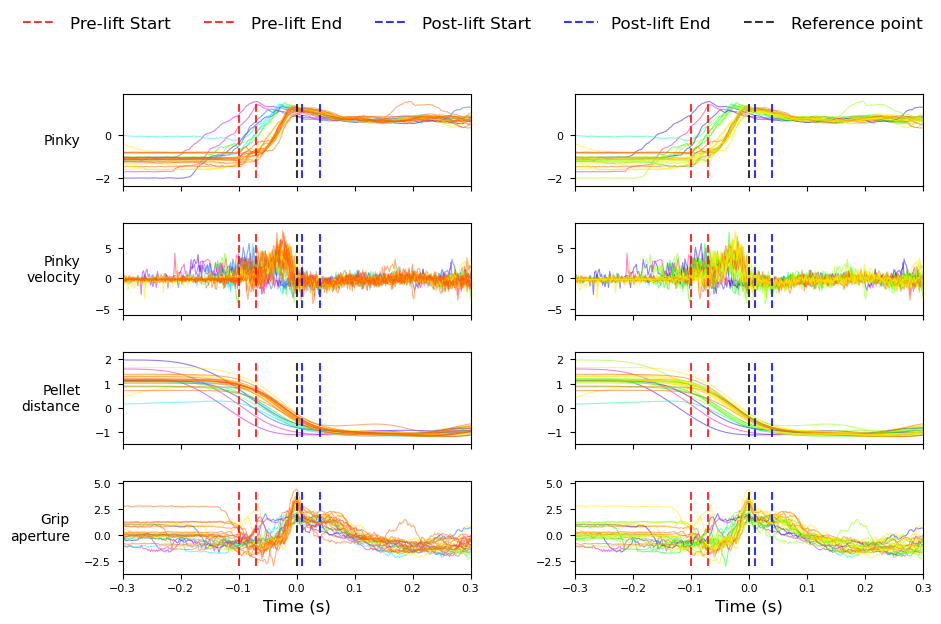

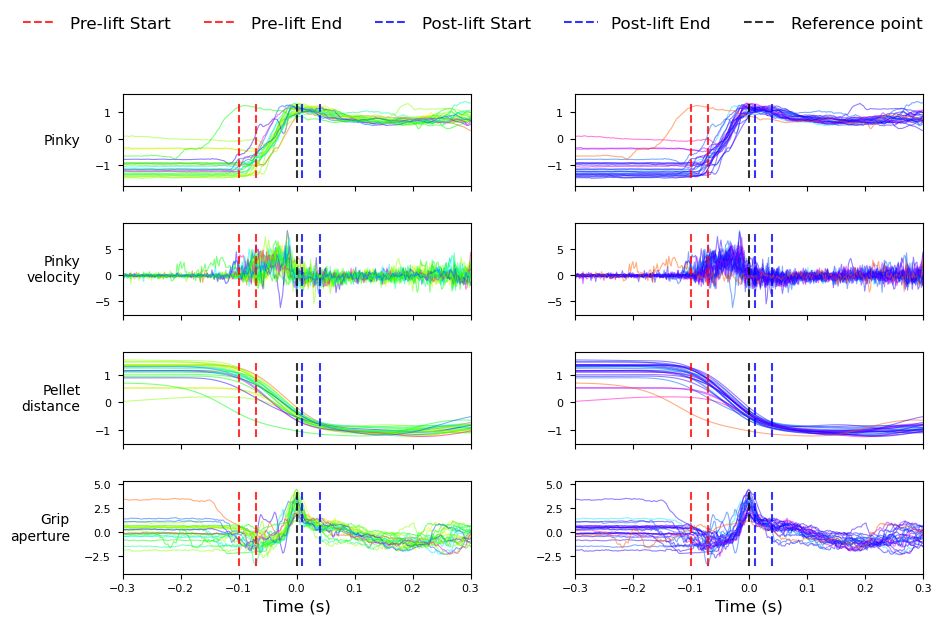

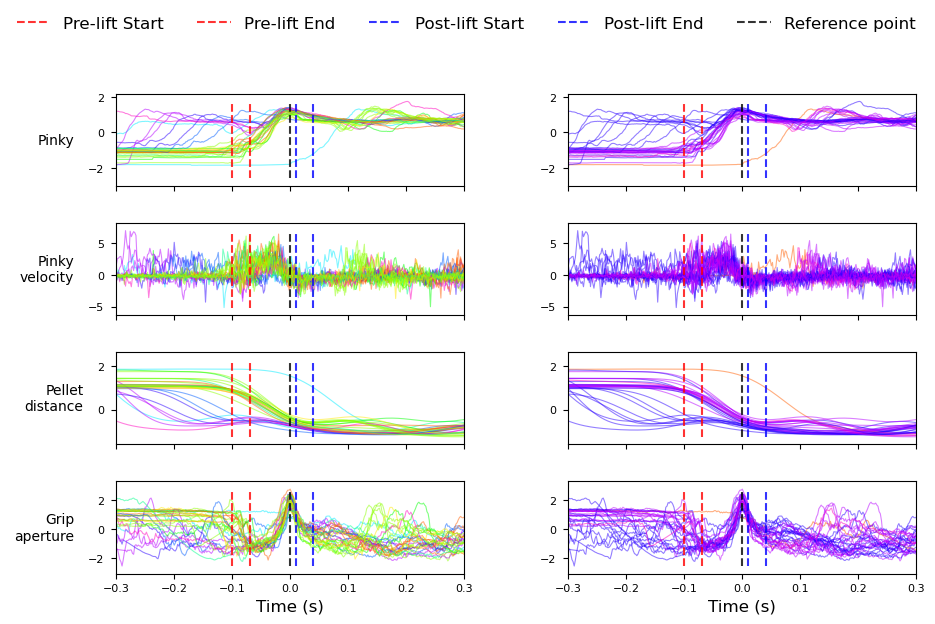

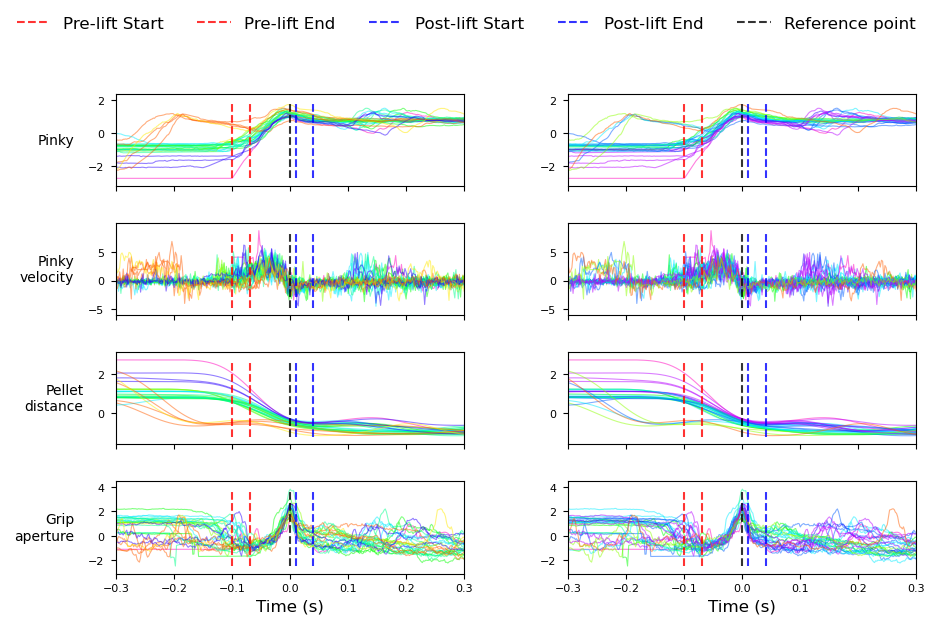

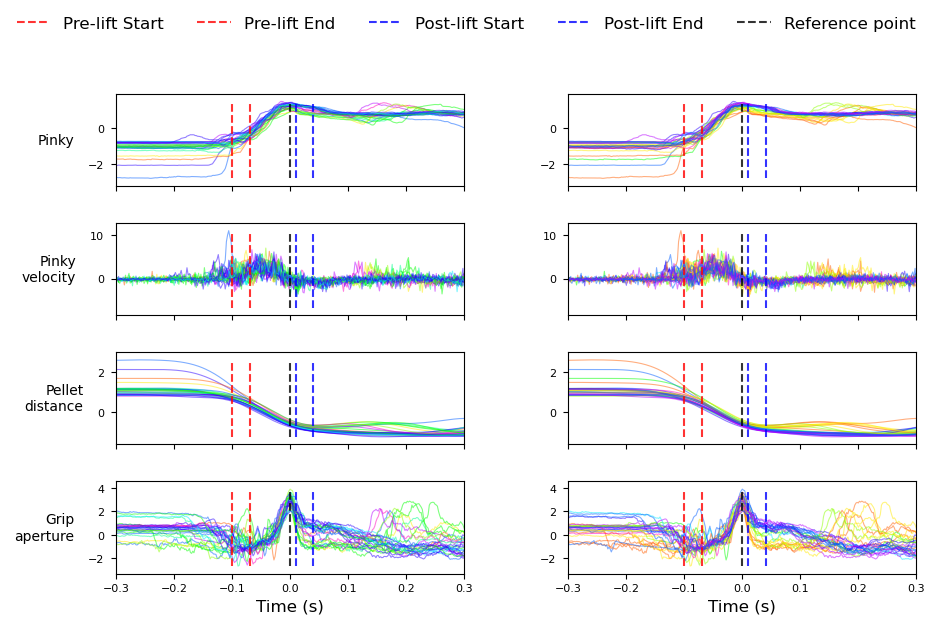

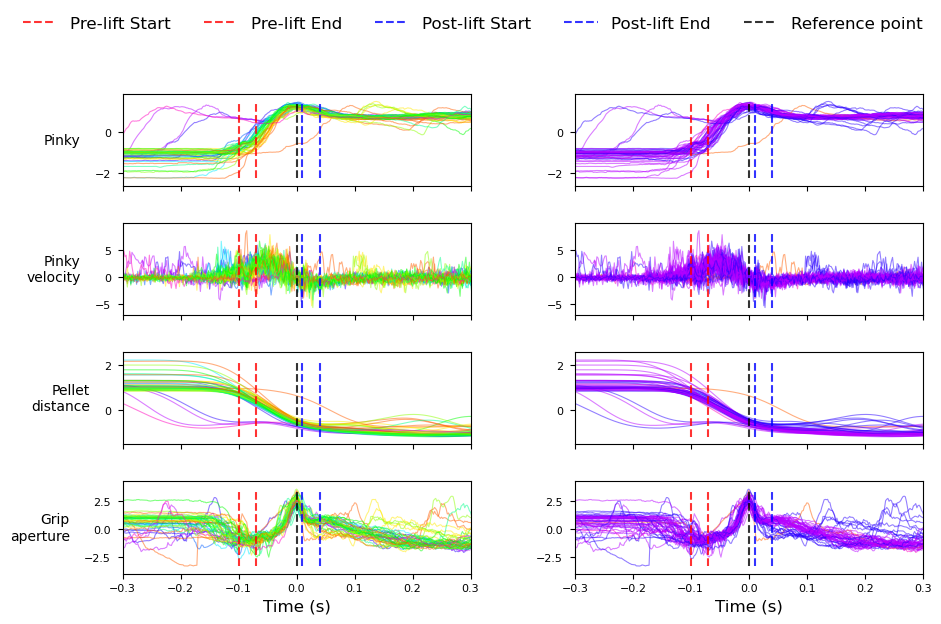

In [29]:
import numpy as np
import matplotlib.pyplot as plt

sessions_to_plot = [k for k in smth_spikes_2.keys() if int(k) < 22]
print(f"Sessions to process: {sessions_to_plot}")
num_sessions = len(sessions_to_plot)
print(f"Number of sessions: {num_sessions}")
# normalize = True # This variable wasn't used in the snippet, keep or remove as needed

for session_key in sessions_to_plot:
    print(f"\n--- Processing Session: {session_key} ---")

    # Check prerequisites for the session
    if session_key not in spikes_2: # Assuming spikes_1 check is still relevant for context
        print(f"Warning: Spike data not found for session {session_key}. Skipping.")
        continue
    if session_key not in grip_aperture_indices_2:
        print(f"Warning: Grip aperture indices not found for session {session_key}. Skipping.")
        continue
    if session_key == '7': # Skip session '7' explicitly
         print("Skipping session '7'.")
         continue

    # Format key and check for behavior data
    formatted_key = format_session_key(session_key)
    if formatted_key not in behavior_2:
        print(f"Warning: Behavior data not found for session {formatted_key}. Skipping.")
        continue

    # Get behavior data for the session
    behavior_data = behavior_2[formatted_key]
    X_interp = behavior_data # Assuming this is the correct variable (trials, time, dims)
    print(f"Behavior data shape (X_interp): {X_interp.shape}")

    # Get pre-calculated grip aperture indices for alignment
    session_grip_indices = grip_aperture_indices_2[session_key]
    print(f"Number of grip aperture indices: {len(session_grip_indices)}")

    # --- Sanity Check: Match trial counts ---
    if X_interp.shape[0] != len(session_grip_indices):
        print(f"Warning: Mismatch in number of trials for session {session_key}. "
              f"Behavior has {X_interp.shape[0]}, Indices have {len(session_grip_indices)}. Skipping alignment.")
        continue

    # --- Align behavior data around max grip aperture index ---
    n_pre = 250
    n_post = 250
    aligned_behavior_windows = []
    valid_trial_indices_for_alignment = [] # Track original trial indices that had valid windows

    for trial_idx in range(X_interp.shape[0]):
        # Get the pre-calculated alignment index for this trial
        try:
            align_idx = int(session_grip_indices[trial_idx])
            # Check for NaN explicitely if indices might contain them
            if np.isnan(align_idx):
                 print(f"Warning: Skipping trial {trial_idx} due to NaN alignment index.")
                 continue
        except (ValueError, TypeError, IndexError): # Added IndexError
            print(f"Warning: Skipping trial {trial_idx} due to invalid or missing index: {session_grip_indices[trial_idx] if trial_idx < len(session_grip_indices) else 'Index out of bounds'}.")
            continue

        # Calculate window start and end indices based on the alignment index
        start_idx = align_idx - n_pre
        end_idx = align_idx + n_post  # +1 for slicing exclusivity

        # Check if the window is within the bounds of the data's time dimension
        if start_idx >= 0 and end_idx <= X_interp.shape[1]:
            # Extract the window for all behavioral dimensions for this trial
            window = X_interp[trial_idx, start_idx:end_idx, :]
            aligned_behavior_windows.append(window)
            valid_trial_indices_for_alignment.append(trial_idx) # Store original index if window is valid
        else:
            print(f"Warning: Skipping trial {trial_idx}. Window [{start_idx}, {end_idx}) "
                  f"out of bounds for data length {X_interp.shape[1]} (align_idx={align_idx}).")

    # Convert the list of valid windows into a 3D numpy array (valid_trials, time, dimensions)
    if not aligned_behavior_windows:
        print(f"Warning: No valid aligned windows found for session {session_key} using provided indices.")
        continue # Skip plotting for this session if no data

    aligned_behavior_array = np.array(aligned_behavior_windows)
    print(f"Shape of aligned behavior data for session {session_key}: {aligned_behavior_array.shape}")

    # Create the corresponding time vector for the aligned window plot
    # Make sure 'dt' is defined in your scope (e.g., dt = 0.002)
    try:
        # This calculation assumes 'dt' is defined earlier
        aligned_time_vector = np.arange(-n_pre, n_post ) * dt
    except NameError:
        print("Error: 'dt' is not defined. Cannot create time vector for plot.")
        # Handle error, maybe define dt = 0.002 here if it's always constant, or skip plotting
        dt = 0.002 # Example fallback - REMOVE IF dt IS DEFINITELY DEFINED EARLIER
        print(f"Using fallback dt = {dt}")
        aligned_time_vector = np.arange(-n_pre, n_post ) * dt


    T_ga = aligned_time_vector

    behavior_data = aligned_behavior_array#behavior_1[format_session_key(session_key)]
    X_interp = behavior_data  

    if X_interp.shape[0] < 20:
        continue
    print(X_interp.shape)


    ### <computing lower dimensional dims> 
    X_interp = np.transpose(X_interp, (1, 2, 0))
    X_interp = normalize_data(X_interp, 0, 499)

    # Process data for vector spaces (Rest to reach)
    P_1, stats_P_1, L_1, stats_L_1, Qp_1, Ql_1, P_proj_1, L_proj_1, principal_components_1, \
    pre_lift_start_1, pre_lift_end_1, post_lift_start_1, post_lift_end_1 = process_data_for_vector_spaces(X_interp, T_ga, tP_1_m2, tL_1_m2,
                                       winsize, dt,  n_behavioral_dims, pre_dims=1)


    print(P_1.shape)
    print(P_proj_1.shape)
    print(L_1.shape)
    print(L_proj_1.shape)
    

    output_file = plot_and_save_components(
        X_interp_filtered= X_interp,
        P_proj=P_proj_1,
        L_proj=L_proj_1,
        T_behavior=T_ga,
        tP_0=tP_1_m2,
        tL_0=tL_1_m2,
        winsize=winsize,
        dt=dt,
        movement_onset=movement_onset,
        n_behavioral_dims=n_behavioral_dims,
        n_trials=X_interp.shape[2],
        mouse=mouse1,
        session_number=session_key,
        list_of_components=[0, 1],  # Components to plot
        dims_to_plot=[0, 9, 18, 19],
        dim_names=["Pinky", "Pinky velocity", "Pellet distance", "Grip aperture"],
        fig_width=10,  # 10 inches wide
        fig_height=6,  # 8 inches tall
        dpi=300  # High resolution (300 DPI is publication quality)
    )


    # Add data to lists
    X_interp_filtered_list_m2.append(X_interp)
    Qp_list_m2.append(Qp_1)
    Ql_list_m2.append(Ql_1)
    T_behavior_list_m2.append(T_ga)
    winsize_P_list_m2.append(winsize)
    tP_0_list_m2.append(tP_1_m2)
    tL_0_list_m2.append(tL_1_m2)
    dt_list_m2.append(dt)
    movement_onset_list_m2.append(movement_onset)
    context_window_list_m2.append(context_window)
    stats_P_list_m2.append(stats_P_1)
    stats_L_list_m2.append(stats_L_1)


## Step 5: Validation of the behavioral motifs

In [30]:
from behavioural_utils import plot_average_rank_correlation

import numpy as np
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from scipy.stats import spearmanr


### Motif 1

#### Mouse 1 

In [31]:
"""
fig1 = plot_average_rank_correlation(
    [X_interp_filtered_list_1[i][:499,:,:] for i in range(len(X_interp_filtered_list_1))],#X_interp_filtered_list_1,
    Qp_list_1,
    Ql_list_1,
    [T_behavior_list_1[i][:499] for i in range(len(T_behavior_list_1))],#T_behavior_list_1,
    winsize_P_list_1,
    tP_0_list_1,
    tL_0_list_1,
    dt_list_1,
    movement_onset_list_1,
    average_max_ga_list_1,
    context_window_list_1,
    stats_P_list_1,
    stats_L_list_1,
    save_plot=False,
    output_file="average_rank_correlation_m1_355.png",
)
"""

'\nfig1 = plot_average_rank_correlation(\n    [X_interp_filtered_list_1[i][:499,:,:] for i in range(len(X_interp_filtered_list_1))],#X_interp_filtered_list_1,\n    Qp_list_1,\n    Ql_list_1,\n    [T_behavior_list_1[i][:499] for i in range(len(T_behavior_list_1))],#T_behavior_list_1,\n    winsize_P_list_1,\n    tP_0_list_1,\n    tL_0_list_1,\n    dt_list_1,\n    movement_onset_list_1,\n    average_max_ga_list_1,\n    context_window_list_1,\n    stats_P_list_1,\n    stats_L_list_1,\n    save_plot=False,\n    output_file="average_rank_correlation_m1_355.png",\n)\n'

#### Mouse 2

In [32]:
"""
fig2 = plot_average_rank_correlation(
    [X_interp_filtered_list_2[i][:499,:,:] for i in range(len(X_interp_filtered_list_2))],#X_interp_filtered_list_1,
    Qp_list_2,
    Ql_list_2,
    [T_behavior_list_2[i][:499] for i in range(len(T_behavior_list_2))],#T_behavior_list_1,
    winsize_P_list_2,
    tP_0_list_2,
    tL_0_list_2,
    dt_list_2,
    movement_onset_list_2,
    average_max_ga_list_2,
    context_window_list_2,
    stats_P_list_2,
    stats_L_list_2,    
    save_plot=False,
    output_file="average_rank_correlation_m1_364.png",
)
"""

'\nfig2 = plot_average_rank_correlation(\n    [X_interp_filtered_list_2[i][:499,:,:] for i in range(len(X_interp_filtered_list_2))],#X_interp_filtered_list_1,\n    Qp_list_2,\n    Ql_list_2,\n    [T_behavior_list_2[i][:499] for i in range(len(T_behavior_list_2))],#T_behavior_list_1,\n    winsize_P_list_2,\n    tP_0_list_2,\n    tL_0_list_2,\n    dt_list_2,\n    movement_onset_list_2,\n    average_max_ga_list_2,\n    context_window_list_2,\n    stats_P_list_2,\n    stats_L_list_2,    \n    save_plot=False,\n    output_file="average_rank_correlation_m1_364.png",\n)\n'

### Motif 2

#### Mouse 1

In [33]:
"""
fig1 = plot_average_rank_correlation(
    X_interp_filtered_list_m1,
    Qp_list_m1,
    Ql_list_m1,
    T_behavior_list_m1,
    winsize_P_list_m1,
    tP_0_list_m1,
    tL_0_list_m1,
    dt_list_m1,
    [-x for x in average_max_ga_list_1],
    movement_onset_list_m1,
    context_window_list_m1,
    stats_P_list_m1,
    stats_L_list_m1,
    save_plot=True,
    output_file="average_rank_correlation_m2_355.png",
)
"""

'\nfig1 = plot_average_rank_correlation(\n    X_interp_filtered_list_m1,\n    Qp_list_m1,\n    Ql_list_m1,\n    T_behavior_list_m1,\n    winsize_P_list_m1,\n    tP_0_list_m1,\n    tL_0_list_m1,\n    dt_list_m1,\n    [-x for x in average_max_ga_list_1],\n    movement_onset_list_m1,\n    context_window_list_m1,\n    stats_P_list_m1,\n    stats_L_list_m1,\n    save_plot=True,\n    output_file="average_rank_correlation_m2_355.png",\n)\n'

#### Mouse 2

In [34]:
"""
fig1 = plot_average_rank_correlation(
    X_interp_filtered_list_m2,
    Qp_list_m2,
    Ql_list_m2,
    T_behavior_list_m2,
    winsize_P_list_m2,
    tP_0_list_m2,
    tL_0_list_m2,
    dt_list_m2,
    [-x for x in average_max_ga_list_2],
    movement_onset_list_m2,
    context_window_list_m2,
    stats_P_list_m2,
    stats_L_list_m2,
    save_plot=True,
    output_file="average_rank_correlation_m2_364.png",
)
"""

'\nfig1 = plot_average_rank_correlation(\n    X_interp_filtered_list_m2,\n    Qp_list_m2,\n    Ql_list_m2,\n    T_behavior_list_m2,\n    winsize_P_list_m2,\n    tP_0_list_m2,\n    tL_0_list_m2,\n    dt_list_m2,\n    [-x for x in average_max_ga_list_2],\n    movement_onset_list_m2,\n    context_window_list_m2,\n    stats_P_list_m2,\n    stats_L_list_m2,\n    save_plot=True,\n    output_file="average_rank_correlation_m2_364.png",\n)\n'

## Step 6: Computation of the trigger dimension 

In [35]:
from scipy.signal import find_peaks
from scipy.ndimage import gaussian_filter1d
from neural_utils import get_trigger_projections, compute_windows_new, correlation_helper_fun
from neural_utils import plot_sessions

### Parameters defintion 

In [36]:
winsize = 15
n_behavioral_dims = 20
pre_dims = 1
movement_onset = 0   
tP_0 = -25 * dt  #9
tL_0 = 30 * dt #-25 * dt# -14 *dt #movement_onset - 10 *dt
list_of_components = [0, 1]
context_window = 250

# Initialize lists to store data for each session
X_interp_filtered_list_1 = []
Qp_list_1 = []
Ql_list_1 = []
T_behavior_list_1 = []
winsize_P_list_1 = []
tP_0_list_1 = []
tL_0_list_1 = []
dt_list_1 = []
movement_onset_list_1 = []
context_window_list_1 = []
stats_P_list_1 = []
stats_L_list_1 = []

# Initialize lists to store data for each session
X_interp_filtered_list_2 = []
Qp_list_2 = []
Ql_list_2 = []
T_behavior_list_2 = []
winsize_P_list_2 = []
tP_0_list_2 = []
tL_0_list_2 = []
dt_list_2 = []
movement_onset_list_2 = []
context_window_list_2 = []
stats_P_list_2 = []
stats_L_list_2 = []  

print(T_neural)
print(T_neural.shape)

[-0.5  -0.49 -0.48 -0.47 -0.46 -0.45 -0.44 -0.43 -0.42 -0.41 -0.4  -0.39
 -0.38 -0.37 -0.36 -0.35 -0.34 -0.33 -0.32 -0.31 -0.3  -0.29 -0.28 -0.27
 -0.26 -0.25 -0.24 -0.23 -0.22 -0.21 -0.2  -0.19 -0.18 -0.17 -0.16 -0.15
 -0.14 -0.13 -0.12 -0.11 -0.1  -0.09 -0.08 -0.07 -0.06 -0.05 -0.04 -0.03
 -0.02 -0.01  0.    0.01  0.02  0.03  0.04  0.05  0.06  0.07  0.08  0.09
  0.1   0.11  0.12  0.13  0.14  0.15  0.16  0.17  0.18  0.19  0.2   0.21
  0.22  0.23  0.24  0.25  0.26  0.27  0.28  0.29  0.3   0.31  0.32  0.33
  0.34  0.35  0.36  0.37  0.38  0.39  0.4   0.41  0.42  0.43  0.44  0.45
  0.46  0.47  0.48  0.49  0.5   0.51  0.52  0.53  0.54  0.55  0.56  0.57
  0.58  0.59  0.6   0.61  0.62  0.63  0.64  0.65  0.66  0.67  0.68  0.69
  0.7   0.71  0.72  0.73  0.74  0.75  0.76  0.77  0.78  0.79  0.8   0.81
  0.82  0.83  0.84  0.85  0.86  0.87  0.88  0.89  0.9   0.91  0.92  0.93
  0.94  0.95  0.96  0.97  0.98  0.99]
(150,)


In [37]:
sessions_data_mouse1 = []  # list to hold dictionaries of results for each session

# Prepare list of sessions to plot
sessions_to_plot = [k for k in smth_spikes_1.keys() if int(k) < 22]
print(sessions_to_plot)
num_sessions = len(sessions_to_plot)
print(num_sessions)

# Truncate T_behavior to go up to index 499
T_behavior = T_behavior[:500]  # Limit to indices 0-499

# Truncate T_neural to go up to index 99
T_neural = T_neural[:100]  # Limit to indices 0-99

for session_key in sessions_to_plot:
    print('Session key')
    print(session_key)

    if not session_key in spikes_1.keys() or session_key == '7' or session_key == '14':
        continue
    
    behavior_data = behavior_1[format_session_key(session_key)]
    X_interp = behavior_data  

    if X_interp.shape[0] < 18:
        continue
    print(X_interp.shape)

    # Compute the grip aperture from hand kinematics
    thumb = X_interp[:, :, 0:3]
    pinky = X_interp[:, :, 3:6]
    grip_ap = np.linalg.norm(thumb - pinky, ord=2, axis=2)
    
    # Truncate grip_ap to indices 0-499
    grip_ap = grip_ap[:, :500]
    print(grip_ap.shape)

    #---------- Pellet distance-based filtering ----------#

    # Calculate the average grip aperture across trials for each time point
    avg_grip_ap = np.mean(grip_ap, axis=0)  # Average across trials
    print(avg_grip_ap.shape)
    grab_idx = []
    delta = 50 

    midpoint = len(avg_grip_ap) // 2

    # Iterate through each trial to find the first maximum after the midpoint
    for trial in range(grip_ap.shape[0]):
        trial_grip_ap = grip_ap[trial]  # Get the grip aperture for the current trial
                    # Find the first maximum after the midpoint
        if midpoint + delta < len(trial_grip_ap):
            after_midpoint = trial_grip_ap[midpoint+delta:]  # Slice the array after the midpoint
            first_max_index = np.argmax(after_midpoint) + midpoint + delta  # Get the index of the first max
            grab_idx.append(first_max_index)  # Store the index
        else:
            grab_idx.append(midpoint)  # Use midpoint if midpoint+delta exceeds array length

    # Split trials into early and late (based on grab index).
    early_idx = np.argsort(grab_idx)[:len(grab_idx)//2]
    late_idx  = np.argsort(grab_idx)[len(grab_idx)//2:]

    print(early_idx)
    print(late_idx)

    early_avg_grip_ap = np.nanmean(grip_ap[early_idx, :], axis=0)
    late_avg_grip_ap  = np.nanmean(grip_ap[late_idx, :], axis=0)
   
    neural_data = spikes_1[session_key]
    
    print('Neural_data')
    print(neural_data.shape)
    
    # Transpose neural data
    neural_data = np.transpose(neural_data, (1, 2, 0))
    
    # Truncate neural data to first 100 time points (indices 0-99)
    neural_data = neural_data[:100, :, :]

    print(T_neural)
    print(neural_data.shape)
    
    C, T_proj = get_trigger_projections(neural_data, T_neural,
                                        win1_start=-0.05, win2_start=0.01, winsize=0.04)
    
    # Smooth the trigger projections for clarity.
    C = gaussian_filter1d(C, 1, axis=0)  # shape typically [time, trials] or [time, ROI]
    
    # Make sure C is truncated to match T_neural's new length
    C = C[:100, :]
    
    early_avg_trig = np.nanmean(C[:, early_idx], axis=1)
    late_avg_trig  = np.nanmean(C[:, late_idx], axis=1)   
    
    t1_start, t1_end, t2_start, t2_end, indices, lowest_grip_ap_value = compute_windows_new(
        T_behavior, 
        early_avg_grip_ap, 
        late_avg_grip_ap, 
        window_length=100, 
        threshold_pct1=0.75, 
        threshold_pct2=0. #00.1
    )
    
    # For consistency with your previous naming:
    new_t_start = t1_start
    new_t_end   = t1_end
    t_start     = t2_start
    t_end       = t2_end
    
    print("Session {}:".format(session_key))
    print("  Window 1 (drop/recovery): new_t_start = {:.3f}, new_t_end = {:.3f}".format(new_t_start, new_t_end))
    print("  Window 2 (original): t_start = {:.3f}, t_end = {:.3f}, lowest grip aperture = {:.3f}"
          .format(t_start, t_end, lowest_grip_ap_value))
    
    # -------------------------
    # Compute Cross‐Correlations
    # -------------------------
    # For Window 2 (original) use t_start and t_end.
    xcorr_trig, lags_trig = correlation_helper_fun(
        early_avg_trig, late_avg_trig,
        t_start, t_end, T_proj
    )
    xcorr_grip_ap, lags_grip_ap = correlation_helper_fun(
        early_avg_grip_ap, late_avg_grip_ap,
        t_start, t_end, T_behavior
    )
    
    # For Window 1 (drop/recovery) use new_t_start and new_t_end.
    new_xcorr_trig, new_lags_trig = correlation_helper_fun(
        early_avg_trig, late_avg_trig,
        new_t_start, new_t_end, T_proj
    )
    new_xcorr_grip, new_lags_grip = correlation_helper_fun(
        early_avg_grip_ap, late_avg_grip_ap,
        new_t_start, new_t_end, T_behavior
    )
    
    # -------------------------
    # Store everything in a dictionary
    # -------------------------
    sess_dict = {
        "session_id": session_key,
        "T_proj": T_proj,
        "T_behavior": T_behavior,
        "C": C, 
        
        "early_avg_trig": early_avg_trig,
        "late_avg_trig": late_avg_trig,
        "early_avg_grip_ap": early_avg_grip_ap,
        "late_avg_grip_ap": late_avg_grip_ap,
        
        "new_t_start": new_t_start,
        "new_t_end": new_t_end,
        "t_start": t_start,
        "t_end": t_end,
        
        "xcorr_trig": xcorr_trig,
        "lags_trig": lags_trig,
        "xcorr_grip_ap": xcorr_grip_ap,
        "lags_grip_ap": lags_grip_ap,
        "grip_ap": grip_ap,
        
        "new_xcorr_trig": new_xcorr_trig,
        "new_lags_trig": new_lags_trig,
        "new_xcorr_grip": new_xcorr_grip,
        "new_lags_grip": new_lags_grip
    }
    
    sessions_data_mouse1.append(sess_dict)

print("\nAll sessions processed. 'sessions_data' now contains all data for each session.")

['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '20', '21']
21
Session key
1
(31, 750, 20)
(31, 500)
(500,)
[30 13  9  8  5  0 18 28  4 17 26 24 14 12 22]
[21 29 16 10 11  2  3 25 15 20  1 23  6 19 27  7]
Neural_data
(31, 150, 50)
[-0.5  -0.49 -0.48 -0.47 -0.46 -0.45 -0.44 -0.43 -0.42 -0.41 -0.4  -0.39
 -0.38 -0.37 -0.36 -0.35 -0.34 -0.33 -0.32 -0.31 -0.3  -0.29 -0.28 -0.27
 -0.26 -0.25 -0.24 -0.23 -0.22 -0.21 -0.2  -0.19 -0.18 -0.17 -0.16 -0.15
 -0.14 -0.13 -0.12 -0.11 -0.1  -0.09 -0.08 -0.07 -0.06 -0.05 -0.04 -0.03
 -0.02 -0.01  0.    0.01  0.02  0.03  0.04  0.05  0.06  0.07  0.08  0.09
  0.1   0.11  0.12  0.13  0.14  0.15  0.16  0.17  0.18  0.19  0.2   0.21
  0.22  0.23  0.24  0.25  0.26  0.27  0.28  0.29  0.3   0.31  0.32  0.33
  0.34  0.35  0.36  0.37  0.38  0.39  0.4   0.41  0.42  0.43  0.44  0.45
  0.46  0.47  0.48  0.49]
(100, 50, 31)
Session 1:
  Window 1 (drop/recovery): new_t_start = 0.000, new_t_end = 0.166
  Window 

In [38]:
sessions_data_mouse2 = []  # list to hold dictionaries of results for each session

# Prepare list of sessions to plot
sessions_to_plot = [k for k in smth_spikes_2.keys() if int(k) < 22]
print(sessions_to_plot)
num_sessions = len(sessions_to_plot)
print(num_sessions)

# Truncate T_behavior to go up to index 499
T_behavior = T_behavior[:500]  # Limit to indices 0-499

# Truncate T_neural to go up to index 99
T_neural = T_neural[:100]  # Limit to indices 0-99

for session_key in sessions_to_plot:
    print('Session key')
    print(session_key)

    if not session_key in spikes_2.keys() or session_key == '7' or session_key == '14':
        continue
    
    behavior_data = behavior_2[format_session_key(session_key)]
    X_interp = behavior_data  

    if X_interp.shape[0] < 20:
        continue
    
    # Compute the grip aperture from hand kinematics
    thumb = X_interp[:, :, 0:3]
    pinky = X_interp[:, :, 3:6]
    grip_ap = np.linalg.norm(thumb - pinky, ord=2, axis=2)
    
    # Truncate grip_ap to indices 0-499
    grip_ap = grip_ap[:, :500]
    print(grip_ap.shape)

    #---------- Pellet distance-based filtering ----------#

    # Calculate the average grip aperture across trials for each time point
    avg_grip_ap = np.mean(grip_ap, axis=0)  # Average across trials
    print(avg_grip_ap.shape)
    grab_idx = []
    delta = 50 

    midpoint = len(avg_grip_ap) // 2 

    # Iterate through each trial to find the first maximum after the midpoint
    for trial in range(grip_ap.shape[0]):
        trial_grip_ap = grip_ap[trial]  # Get the grip aperture for the current trial
                    # Find the first maximum after the midpoint
        if midpoint + delta < len(trial_grip_ap):
            after_midpoint = trial_grip_ap[midpoint+delta:]  # Slice the array after the midpoint
            first_max_index = np.argmax(after_midpoint) + midpoint + delta  # Get the index of the first max
            grab_idx.append(first_max_index)  # Store the index
        else:
            grab_idx.append(midpoint)  # Use midpoint if midpoint+delta exceeds array length

    # Split trials into early and late (based on grab index).
    early_idx = np.argsort(grab_idx)[:len(grab_idx)//2]
    late_idx  = np.argsort(grab_idx)[len(grab_idx)//2:]

    print(early_idx)
    print(late_idx)

    early_avg_grip_ap = np.nanmean(grip_ap[early_idx, :], axis=0)
    late_avg_grip_ap  = np.nanmean(grip_ap[late_idx, :], axis=0)
   
    neural_data = spikes_2[session_key]

    print('Neural_data')
    print(neural_data.shape)
    
    # Transpose neural data
    neural_data = np.transpose(neural_data, (1, 2, 0))
    
    # Truncate neural data to first 100 time points (indices 0-99)
    neural_data = neural_data[:100, :, :]

    print(T_neural)
    print(neural_data.shape)
    
    C, T_proj = get_trigger_projections(neural_data, T_neural,
                                        win1_start=-0.05, win2_start=0.01, winsize=0.04)
    
    # Smooth the trigger projections for clarity.
    C = gaussian_filter1d(C, 1, axis=0)  # shape typically [time, trials] or [time, ROI]
    
    # Make sure C is truncated to match T_neural's new length
    C = C[:100, :]
    
    early_avg_trig = np.nanmean(C[:, early_idx], axis=1)
    late_avg_trig  = np.nanmean(C[:, late_idx], axis=1)   
    
    print(early_avg_grip_ap.shape)

    t1_start, t1_end, t2_start, t2_end, indices, lowest_grip_ap_value = compute_windows_new(
        T_behavior, 
        early_avg_grip_ap, 
        late_avg_grip_ap, 
        window_length=100, 
        threshold_pct1=0.75, 
        threshold_pct2=0. #00.1
    )
    
    # For consistency with your previous naming:
    new_t_start = t1_start
    new_t_end   = t1_end
    t_start     = t2_start
    t_end       = t2_end
    
    print("Session {}:".format(session_key))
    print("  Window 1 (drop/recovery): new_t_start = {:.3f}, new_t_end = {:.3f}".format(new_t_start, new_t_end))
    print("  Window 2 (original): t_start = {:.3f}, t_end = {:.3f}, lowest grip aperture = {:.3f}"
          .format(t_start, t_end, lowest_grip_ap_value))
    
    # -------------------------
    # Compute Cross‐Correlations
    # -------------------------
    # For Window 2 (original) use t_start and t_end.
    xcorr_trig, lags_trig = correlation_helper_fun(
        early_avg_trig, late_avg_trig,
        t_start, t_end, T_proj
    )
    xcorr_grip_ap, lags_grip_ap = correlation_helper_fun(
        early_avg_grip_ap, late_avg_grip_ap,
        t_start, t_end, T_behavior
    )
    
    # For Window 1 (drop/recovery) use new_t_start and new_t_end.
    new_xcorr_trig, new_lags_trig = correlation_helper_fun(
        early_avg_trig, late_avg_trig,
        new_t_start, new_t_end, T_proj
    )
    new_xcorr_grip, new_lags_grip = correlation_helper_fun(
        early_avg_grip_ap, late_avg_grip_ap,
        new_t_start, new_t_end, T_behavior
    )
    
    print('Attention')
    print(C.shape)
    
    # -------------------------
    # Store everything in a dictionary
    # -------------------------
    sess_dict = {
        "session_id": session_key,
        "T_proj": T_proj,
        "T_behavior": T_behavior,
        "C": C, 
        
        "early_avg_trig": early_avg_trig,
        "late_avg_trig": late_avg_trig,
        "early_avg_grip_ap": early_avg_grip_ap,
        "late_avg_grip_ap": late_avg_grip_ap,
        
        "new_t_start": new_t_start,
        "new_t_end": new_t_end,
        "t_start": t_start,
        "t_end": t_end,
        
        "xcorr_trig": xcorr_trig,
        "lags_trig": lags_trig,
        "xcorr_grip_ap": xcorr_grip_ap,
        "lags_grip_ap": lags_grip_ap,
        "grip_ap": grip_ap,
        
        "new_xcorr_trig": new_xcorr_trig,
        "new_lags_trig": new_lags_trig,
        "new_xcorr_grip": new_xcorr_grip,
        "new_lags_grip": new_lags_grip
    }
    
    sessions_data_mouse2.append(sess_dict)

print("\nAll sessions processed. 'sessions_data' now contains all data for each session.")

['1', '2', '3', '4', '5', '6']
6
Session key
1
(26, 500)
(500,)
[25 24 21 18 22 16 23 14 15 11 17 20 10]
[13  7 19  9  5 12  4  8  6  3  2  1  0]
Neural_data
(26, 150, 164)
[-0.5  -0.49 -0.48 -0.47 -0.46 -0.45 -0.44 -0.43 -0.42 -0.41 -0.4  -0.39
 -0.38 -0.37 -0.36 -0.35 -0.34 -0.33 -0.32 -0.31 -0.3  -0.29 -0.28 -0.27
 -0.26 -0.25 -0.24 -0.23 -0.22 -0.21 -0.2  -0.19 -0.18 -0.17 -0.16 -0.15
 -0.14 -0.13 -0.12 -0.11 -0.1  -0.09 -0.08 -0.07 -0.06 -0.05 -0.04 -0.03
 -0.02 -0.01  0.    0.01  0.02  0.03  0.04  0.05  0.06  0.07  0.08  0.09
  0.1   0.11  0.12  0.13  0.14  0.15  0.16  0.17  0.18  0.19  0.2   0.21
  0.22  0.23  0.24  0.25  0.26  0.27  0.28  0.29  0.3   0.31  0.32  0.33
  0.34  0.35  0.36  0.37  0.38  0.39  0.4   0.41  0.42  0.43  0.44  0.45
  0.46  0.47  0.48  0.49]
(100, 164, 26)
(500,)
Session 1:
  Window 1 (drop/recovery): new_t_start = 0.000, new_t_end = 0.144
  Window 2 (original): t_start = 0.146, t_end = 0.398, lowest grip aperture = 2.000
Attention
(100, 26)
Session key
2

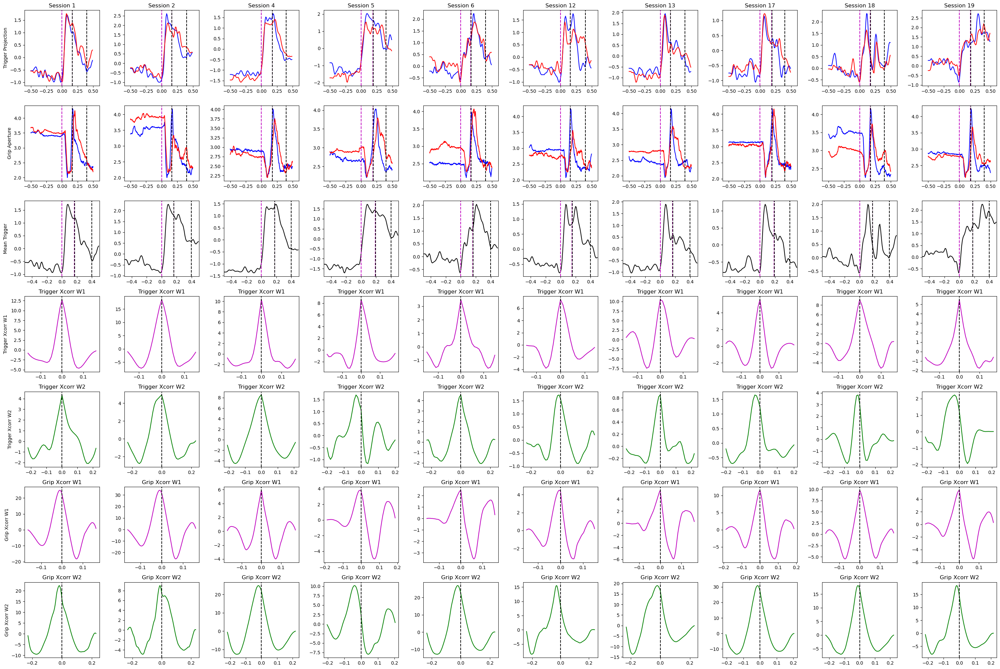

In [39]:
plot_sessions(sessions_data_mouse1, n_sessions=len(sessions_data_mouse1))

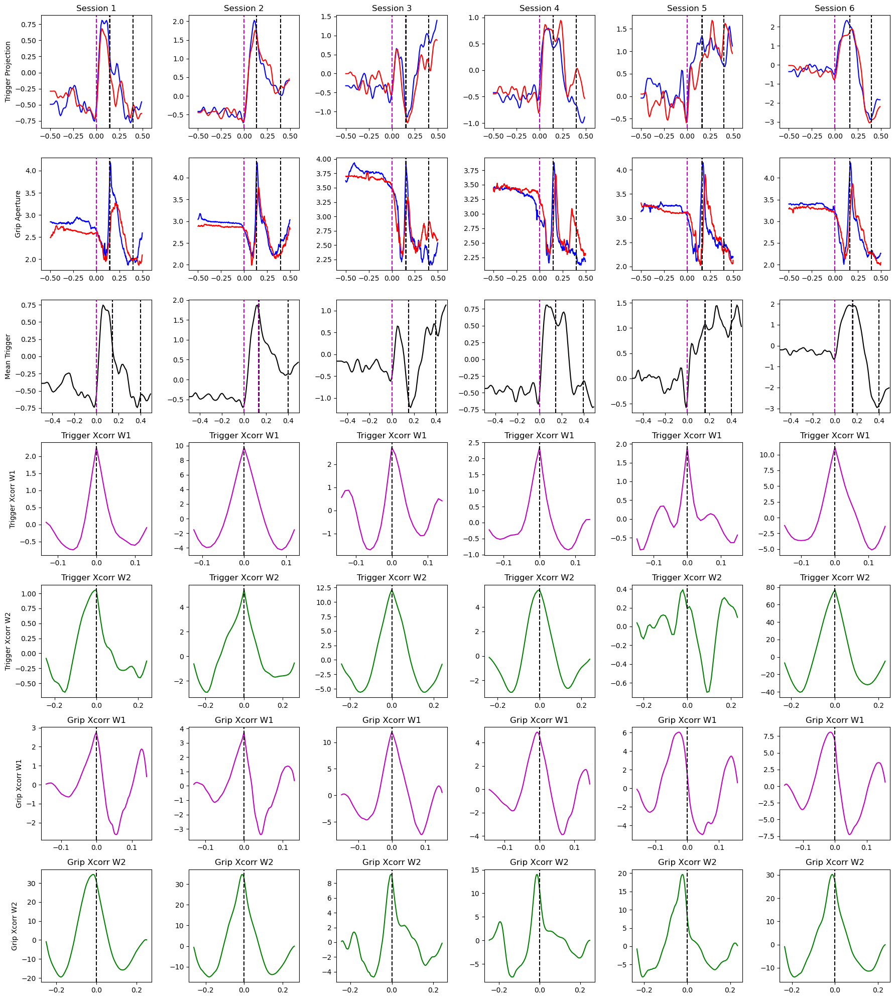

In [40]:
plot_sessions(sessions_data_mouse2, n_sessions=len(sessions_data_mouse2))

## Step 7: Optimal lag estimation 

In [41]:
from neural_utils import plot_all_metrics_boxplots

In [42]:
plot_all_metrics_boxplots(sessions_data_mouse1, sessions_data_mouse2) 

Wilcoxon signed‑rank tests (median vs. 0):

--- Window 1 ---
Mouse #1, H₀ median ≠ 0: n=10, W=5.00, p<0.05
Mouse #1, H₀ median > 0: n=10, W=50.00, p<0.05
Mouse #1, H₀ median < 0: n=10, W=50.00, p=0.993
Mouse #2, H₀ median ≠ 0: n=6, W=5.00, p=0.312
Mouse #2, H₀ median > 0: n=6, W=16.00, p=0.156
Mouse #2, H₀ median < 0: n=6, W=16.00, p=0.891
Combined, H₀ median ≠ 0: n=16, W=19.00, p<0.05
Combined, H₀ median > 0: n=16, W=117.00, p<0.05
Combined, H₀ median < 0: n=16, W=117.00, p=0.996

--- Window 2 ---
Mouse #1, H₀ median ≠ 0: n=10, W=1.00, p<0.05
Mouse #1, H₀ median > 0: n=10, W=1.00, p=0.999
Mouse #1, H₀ median < 0: n=10, W=1.00, p<0.05
Mouse #2, H₀ median ≠ 0: n=6, W=1.00, p=0.062
Mouse #2, H₀ median > 0: n=6, W=1.00, p=0.984
Mouse #2, H₀ median < 0: n=6, W=1.00, p<0.05
Combined, H₀ median ≠ 0: n=16, W=3.00, p<0.05
Combined, H₀ median > 0: n=16, W=3.00, p=1.000
Combined, H₀ median < 0: n=16, W=3.00, p<0.05


## Step 8: Weights of the trigger analysis

In [43]:
from neural_utils import get_trigger_projections_w
from neural_utils import plot_svm_weights


### Mouse #1 

In [48]:
import numpy as np
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# =============================================================================
# SECOND PASS: Store relevant information (including SVM weights) per session
# =============================================================================

# Similar to how you did sessions_data_mouse1 = [], here we'll store session dictionaries:
sessions_data_mouse1_svm = []  

# Prepare list of sessions to plot
sessions_to_plot = [k for k in smth_spikes_1.keys() if int(k) < 22]
print(sessions_to_plot)
num_sessions = len(sessions_to_plot)
print(num_sessions)

for session_key in sessions_to_plot:
    print('Session key')
    print(session_key)

    if not session_key in spikes_1.keys() or session_key == '7':
        continue
    
    behavior_data = behavior_1[format_session_key(session_key)]
    X_interp = behavior_data[:,:500,:] 
    print(X_interp.shape)

    if X_interp.shape[0] < 20:
        continue
    
    # Compute the grip aperture from hand kinematics
    thumb = X_interp[:, :, 0:3]
    pinky = X_interp[:, :, 3:6]
    grip_ap = np.linalg.norm(thumb - pinky, ord=2, axis=2)
    print(grip_ap.shape)

    neural_data = spikes_1[session_key]
    print('Neural_data')
    print(neural_data.shape)
    neural_data = np.transpose(neural_data, (1, 2, 0))
    print(neural_data.shape)
    neural_data = neural_data[:100,:,:]

    trigger_proj, T_proj, coeffs_total = get_trigger_projections_w(neural_data, T_neural,
                                                                   win1_start=-0.05,
                                                                   win2_start=0.03,
                                                                   winsize=0.04)


    # -------------------------
    # Store everything in a dictionary
    # -------------------------
    session_dict = {
        "session_id": session_key,
        "T_behavior": T_behavior,
        "T_neural": T_neural,
        "T_proj": T_proj,
        "trigger_proj": trigger_proj,
        "coeffs_total": coeffs_total,   # SVM weight vector, or other relevant info
        # Optionally store any other items you want to keep track of:
        "X_interp": X_interp,
        "grab_idx": grab_idx,
        "grip_ap": grip_ap,

    }
    
    sessions_data_mouse1_svm.append(session_dict)

print("\nAll sessions processed. 'sessions_data_mouse1_svm' now contains all data for each session.")




['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '20', '21']
21
Session key
1
(31, 500, 20)
(31, 500)
Neural_data
(31, 150, 50)
(150, 50, 31)
Session key
2
(24, 500, 20)
(24, 500)
Neural_data
(24, 150, 68)
(150, 68, 24)
Session key
3
(8, 500, 19)
Session key
4
(37, 500, 20)
(37, 500)
Neural_data
(37, 150, 65)
(150, 65, 37)
Session key
5
(44, 500, 20)
(44, 500)
Neural_data
(44, 150, 68)
(150, 68, 44)
Session key
6
(21, 500, 20)
(21, 500)
Neural_data
(21, 150, 65)
(150, 65, 21)
Session key
7
Session key
8
(11, 500, 19)
Session key
9
(13, 500, 19)
Session key
10
(7, 500, 19)
Session key
11
(6, 500, 19)
Session key
12
(27, 500, 20)
(27, 500)
Neural_data
(27, 150, 86)
(150, 86, 27)
Session key
13
(35, 500, 20)
(35, 500)
Neural_data
(35, 150, 61)
(150, 61, 35)
Session key
14
(18, 500, 19)
Session key
15
(17, 500, 19)
Session key
16
(4, 500, 19)
Session key
17
(18, 500, 20)
Session key
18
(44, 500, 20)
(44, 500)
Neural_data
(44, 150, 13

### Mouse 2

In [50]:
import numpy as np
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# =============================================================================
# SECOND PASS: Store relevant information (including SVM weights) per session
# =============================================================================

# Similar to how you did sessions_data_mouse1 = [], here we'll store session dictionaries:
sessions_data_mouse2_svm = []  

# Prepare list of sessions to plot
sessions_to_plot = [k for k in smth_spikes_2.keys() if int(k) < 22]
print(sessions_to_plot)
num_sessions = len(sessions_to_plot)
print(num_sessions)

for session_key in sessions_to_plot:
    print('Session key')
    print(session_key)

    if not session_key in spikes_2.keys() or session_key == '7':
        continue
    
    behavior_data = behavior_2[format_session_key(session_key)]
    X_interp = behavior_data[:,:500,:] 

    if X_interp.shape[0] < 20:
        continue
    
    # Compute the grip aperture from hand kinematics
    thumb = X_interp[:, :, 0:3]
    pinky = X_interp[:, :, 3:6]
    grip_ap = np.linalg.norm(thumb - pinky, ord=2, axis=2)
    print(grip_ap.shape)

    neural_data = spikes_2[session_key]
    print('Neural_data')
    print(neural_data.shape)
    neural_data = np.transpose(neural_data, (1, 2, 0))
    neural_data = neural_data[:100,:,:]

    trigger_proj, T_proj, coeffs_total = get_trigger_projections_w(neural_data, T_neural,
                                                                   win1_start=-0.06,
                                                                   win2_start=0.02,
                                                                   winsize=0.03)


    # -------------------------
    # Store everything in a dictionary
    # -------------------------
    session_dict = {
        "session_id": session_key,
        "T_behavior": T_behavior,
        "T_neural": T_neural,
        "T_proj": T_proj,
        "trigger_proj": trigger_proj,
        "coeffs_total": coeffs_total,   # SVM weight vector, or other relevant info
        # Optionally store any other items you want to keep track of:
        "X_interp": X_interp,
        "grab_idx": grab_idx,
        "grip_ap": grip_ap,

    }
    
    sessions_data_mouse2_svm.append(session_dict)

print("\nAll sessions processed. 'sessions_data_mouse1_svm' now contains all data for each session.")




['1', '2', '3', '4', '5', '6']
6
Session key
1
(26, 500)
Neural_data
(26, 150, 164)
Session key
2
(24, 500)
Neural_data
(24, 150, 167)
Session key
3
(29, 500)
Neural_data
(29, 150, 116)
Session key
4
(28, 500)
Neural_data
(28, 150, 135)
Session key
5
(27, 500)
Neural_data
(27, 150, 89)
Session key
6
(46, 500)
Neural_data
(46, 150, 106)

All sessions processed. 'sessions_data_mouse1_svm' now contains all data for each session.


### Viusalisation

In [51]:
fig1 = plot_svm_weights(session_data=sessions_data_mouse1_svm,  selected_sessions=[0, 2, 7], save_path="svm_weights_1.png")
#fig1 = plot_svm_weights(session_data=sessions_data_mouse1_svm, save_path="svm_weights_1.png")
fig1.show()

In [52]:
fig2 = plot_svm_weights(session_data=sessions_data_mouse2_svm,  selected_sessions=[0,1 , 5], save_path="svm_weights_2.png")
fig2.show()

## Step 9: Single-trial analysis 

In [53]:
from neural_utils import plot_multi_session_correlations_separate_plotly

### Session-wide

### Mouse 1

In [54]:
# Usage:
session_ids = ['1', '2', '4', '5', '6',  '12', '13','17',  '18', '19']

results = plot_multi_session_correlations_separate_plotly(sessions_data_mouse1, session_ids)

Analyzing session 1...
Session 1 - Alternative correlation (Max Grip → Trigger Peak): r=0.086, p=0.6463
Session 1 - Correlation between peak indices and max grip times: r=0.234, p=0.2057



Summary for Session 1:
Total trials analyzed: 31
Trials with single peak before max grip (≥3rd peak): 0 (0.0%)
Trials with single peak before max grip (no peaks for 80ms after): 1 (3.2%)
Trials with latest of multiple peaks before max grip: 22 (71.0%)
Trials using 2nd peak from t=0: 8 (25.8%)
Average time difference (max grip - trigger peak): 0.015s
Correlation: r = 0.086, p = 0.6463
Analyzing session 2...
Session 2 - Alternative correlation (Max Grip → Trigger Peak): r=0.801, p=0.0000
Session 2 - Correlation between peak indices and max grip times: r=0.644, p=0.0007



Summary for Session 2:
Total trials analyzed: 24
Trials with single peak before max grip (≥3rd peak): 0 (0.0%)
Trials with single peak before max grip (no peaks for 80ms after): 2 (8.3%)
Trials with latest of multiple peaks before max grip: 12 (50.0%)
Trials using 2nd peak from t=0: 10 (41.7%)
Average time difference (max grip - trigger peak): 0.014s
Correlation: r = 0.801, p = 0.0000
Analyzing session 4...
Session 4 - Alternative correlation (Max Grip → Trigger Peak): r=0.810, p=0.0000
Session 4 - Correlation between peak indices and max grip times: r=0.855, p=0.0000



Summary for Session 4:
Total trials analyzed: 37
Trials with single peak before max grip (≥3rd peak): 0 (0.0%)
Trials with single peak before max grip (no peaks for 80ms after): 0 (0.0%)
Trials with latest of multiple peaks before max grip: 30 (81.1%)
Trials using 2nd peak from t=0: 7 (18.9%)
Average time difference (max grip - trigger peak): 0.041s
Correlation: r = 0.810, p = 0.0000
Analyzing session 5...
Session 5 - Alternative correlation (Max Grip → Trigger Peak): r=0.833, p=0.0000
Session 5 - Correlation between peak indices and max grip times: r=0.753, p=0.0000



Summary for Session 5:
Total trials analyzed: 44
Trials with single peak before max grip (≥3rd peak): 0 (0.0%)
Trials with single peak before max grip (no peaks for 80ms after): 0 (0.0%)
Trials with latest of multiple peaks before max grip: 42 (95.5%)
Trials using 2nd peak from t=0: 2 (4.5%)
Average time difference (max grip - trigger peak): 0.055s
Correlation: r = 0.833, p = 0.0000
Analyzing session 6...
Session 6 - Alternative correlation (Max Grip → Trigger Peak): r=0.712, p=0.0003
Session 6 - Correlation between peak indices and max grip times: r=0.861, p=0.0000



Summary for Session 6:
Total trials analyzed: 21
Trials with single peak before max grip (≥3rd peak): 0 (0.0%)
Trials with single peak before max grip (no peaks for 80ms after): 0 (0.0%)
Trials with latest of multiple peaks before max grip: 14 (66.7%)
Trials using 2nd peak from t=0: 7 (33.3%)
Average time difference (max grip - trigger peak): 0.024s
Correlation: r = 0.712, p = 0.0003
Analyzing session 12...
Session 12 - Alternative correlation (Max Grip → Trigger Peak): r=0.762, p=0.0000
Session 12 - Correlation between peak indices and max grip times: r=0.692, p=0.0001



Summary for Session 12:
Total trials analyzed: 27
Trials with single peak before max grip (≥3rd peak): 0 (0.0%)
Trials with single peak before max grip (no peaks for 80ms after): 1 (3.7%)
Trials with latest of multiple peaks before max grip: 15 (55.6%)
Trials using 2nd peak from t=0: 11 (40.7%)
Average time difference (max grip - trigger peak): 0.022s
Correlation: r = 0.762, p = 0.0000
Analyzing session 13...
Session 13 - Alternative correlation (Max Grip → Trigger Peak): r=0.565, p=0.0004
Session 13 - Correlation between peak indices and max grip times: r=0.641, p=0.0000



Summary for Session 13:
Total trials analyzed: 35
Trials with single peak before max grip (≥3rd peak): 0 (0.0%)
Trials with single peak before max grip (no peaks for 80ms after): 3 (8.6%)
Trials with latest of multiple peaks before max grip: 23 (65.7%)
Trials using 2nd peak from t=0: 9 (25.7%)
Average time difference (max grip - trigger peak): 0.018s
Correlation: r = 0.565, p = 0.0004
Analyzing session 17...
Session 17 - Alternative correlation (Max Grip → Trigger Peak): r=0.486, p=0.0410
Session 17 - Correlation between peak indices and max grip times: r=0.236, p=0.3461



Summary for Session 17:
Total trials analyzed: 18
Trials with single peak before max grip (≥3rd peak): 0 (0.0%)
Trials with single peak before max grip (no peaks for 80ms after): 0 (0.0%)
Trials with latest of multiple peaks before max grip: 15 (83.3%)
Trials using 2nd peak from t=0: 3 (16.7%)
Average time difference (max grip - trigger peak): 0.025s
Correlation: r = 0.486, p = 0.0410
Analyzing session 18...
Session 18 - Alternative correlation (Max Grip → Trigger Peak): r=0.832, p=0.0000
Session 18 - Correlation between peak indices and max grip times: r=0.723, p=0.0000



Summary for Session 18:
Total trials analyzed: 44
Trials with single peak before max grip (≥3rd peak): 0 (0.0%)
Trials with single peak before max grip (no peaks for 80ms after): 6 (13.6%)
Trials with latest of multiple peaks before max grip: 32 (72.7%)
Trials using 2nd peak from t=0: 6 (13.6%)
Average time difference (max grip - trigger peak): 0.039s
Correlation: r = 0.832, p = 0.0000
Analyzing session 19...
Session 19 - Alternative correlation (Max Grip → Trigger Peak): r=0.798, p=0.0000
Session 19 - Correlation between peak indices and max grip times: r=0.702, p=0.0000



Summary for Session 19:
Total trials analyzed: 66
Trials with single peak before max grip (≥3rd peak): 0 (0.0%)
Trials with single peak before max grip (no peaks for 80ms after): 3 (4.5%)
Trials with latest of multiple peaks before max grip: 50 (75.8%)
Trials using 2nd peak from t=0: 13 (19.7%)
Average time difference (max grip - trigger peak): 0.032s
Correlation: r = 0.798, p = 0.0000



Overall Summary Across All Sessions:
---------------------------------
Total sessions analyzed: 10
Average correlation: 0.668
Average time difference: 0.029s


### Mouse 2

In [55]:
# Usage:
session_ids_2 = ['1', '2','3', '4', '5', '6',]

results = plot_multi_session_correlations_separate_plotly(sessions_data_mouse2, session_ids_2)

Analyzing session 1...
Session 1 - Alternative correlation (Max Grip → Trigger Peak): r=0.392, p=0.0477
Session 1 - Correlation between peak indices and max grip times: r=0.719, p=0.0000



Summary for Session 1:
Total trials analyzed: 26
Trials with single peak before max grip (≥3rd peak): 0 (0.0%)
Trials with single peak before max grip (no peaks for 80ms after): 0 (0.0%)
Trials with latest of multiple peaks before max grip: 15 (57.7%)
Trials using 2nd peak from t=0: 11 (42.3%)
Average time difference (max grip - trigger peak): 0.012s
Correlation: r = 0.392, p = 0.0477
Analyzing session 2...
Session 2 - Alternative correlation (Max Grip → Trigger Peak): r=-0.077, p=0.7214
Session 2 - Correlation between peak indices and max grip times: r=0.312, p=0.1379



Summary for Session 2:
Total trials analyzed: 24
Trials with single peak before max grip (≥3rd peak): 0 (0.0%)
Trials with single peak before max grip (no peaks for 80ms after): 8 (33.3%)
Trials with latest of multiple peaks before max grip: 5 (20.8%)
Trials using 2nd peak from t=0: 11 (45.8%)
Average time difference (max grip - trigger peak): -0.009s
Correlation: r = -0.077, p = 0.7214
Analyzing session 3...
Session 3 - Alternative correlation (Max Grip → Trigger Peak): r=0.838, p=0.0000
Session 3 - Correlation between peak indices and max grip times: r=0.702, p=0.0000



Summary for Session 3:
Total trials analyzed: 29
Trials with single peak before max grip (≥3rd peak): 0 (0.0%)
Trials with single peak before max grip (no peaks for 80ms after): 4 (13.8%)
Trials with latest of multiple peaks before max grip: 20 (69.0%)
Trials using 2nd peak from t=0: 5 (17.2%)
Average time difference (max grip - trigger peak): 0.043s
Correlation: r = 0.838, p = 0.0000
Analyzing session 4...
Session 4 - Alternative correlation (Max Grip → Trigger Peak): r=0.832, p=0.0000
Session 4 - Correlation between peak indices and max grip times: r=0.914, p=0.0000



Summary for Session 4:
Total trials analyzed: 28
Trials with single peak before max grip (≥3rd peak): 0 (0.0%)
Trials with single peak before max grip (no peaks for 80ms after): 1 (3.6%)
Trials with latest of multiple peaks before max grip: 19 (67.9%)
Trials using 2nd peak from t=0: 8 (28.6%)
Average time difference (max grip - trigger peak): 0.026s
Correlation: r = 0.832, p = 0.0000
Analyzing session 5...
Session 5 - Alternative correlation (Max Grip → Trigger Peak): r=0.297, p=0.1330
Session 5 - Correlation between peak indices and max grip times: r=0.462, p=0.0152



Summary for Session 5:
Total trials analyzed: 27
Trials with single peak before max grip (≥3rd peak): 0 (0.0%)
Trials with single peak before max grip (no peaks for 80ms after): 0 (0.0%)
Trials with latest of multiple peaks before max grip: 22 (81.5%)
Trials using 2nd peak from t=0: 5 (18.5%)
Average time difference (max grip - trigger peak): 0.031s
Correlation: r = 0.297, p = 0.1330
Analyzing session 6...
Session 6 - Alternative correlation (Max Grip → Trigger Peak): r=0.661, p=0.0000
Session 6 - Correlation between peak indices and max grip times: r=0.722, p=0.0000



Summary for Session 6:
Total trials analyzed: 46
Trials with single peak before max grip (≥3rd peak): 0 (0.0%)
Trials with single peak before max grip (no peaks for 80ms after): 4 (8.7%)
Trials with latest of multiple peaks before max grip: 29 (63.0%)
Trials using 2nd peak from t=0: 13 (28.3%)
Average time difference (max grip - trigger peak): 0.016s
Correlation: r = 0.661, p = 0.0000



Overall Summary Across All Sessions:
---------------------------------
Total sessions analyzed: 6
Average correlation: 0.490
Average time difference: 0.020s


### Single example visualisation

In [56]:
from neural_utils import plot_single_session_analysis_with_signals_plotly

In [57]:
result = plot_single_session_analysis_with_signals_plotly(sessions_data_mouse1, '5', max_trials_to_show=40)

In [58]:

result = plot_single_session_analysis_with_signals_plotly(sessions_data_mouse1, '5', max_trials_to_show=60)

# Display the summary plot
result['summary'].show()

# Display individual trial plots (for example, first 5)
for i, fig in enumerate(result['trials'][:10]):
    fig.show()

# Print summary info
print(f"Session: {result['info']['session_id']}")
print(f"Number of trials: {result['info']['n_trials']}")
print(f"Average time difference: {result['info']['avg_time_diff_ms']:.1f} ms")


Session: 5
Number of trials: 44
Average time difference: -55.2 ms
